In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = "/content/drive/MyDrive/Train.csv"
age = pd.read_csv(path)

In [ ]:
# Check the structure and data types of the dataset
age.info()

# Display the first few rows to understand the data format
age.head()

# Display basic statistics for numerical columns
age.describe()

# Check for unique values in categorical columns
for col in age.select_dtypes(include=['object']).columns:
    print(f"Unique values in {col}:\n", age[col].unique())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       3000 non-null   object 
 1   Height (cm)                  3000 non-null   float64
 2   Weight (kg)                  3000 non-null   float64
 3   Blood Pressure (s/d)         3000 non-null   object 
 4   Cholesterol Level (mg/dL)    3000 non-null   float64
 5   BMI                          3000 non-null   float64
 6   Blood Glucose Level (mg/dL)  3000 non-null   float64
 7   Bone Density (g/cm²)         3000 non-null   float64
 8   Vision Sharpness             3000 non-null   float64
 9   Hearing Ability (dB)         3000 non-null   float64
 10  Physical Activity Level      3000 non-null   object 
 11  Smoking Status               3000 non-null   object 
 12  Alcohol Consumption          1799 non-null   object 
 13  Diet              

#Data Visualisation


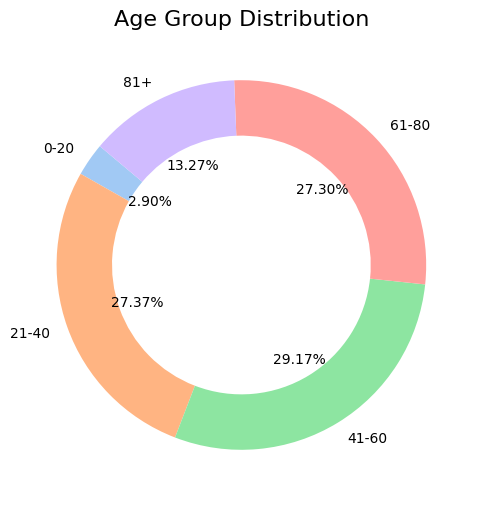

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your dataset is already loaded as 'dataset' and the last column is 'Age (years)'
# Bin the ages into specified groups
bins = [0, 20, 40, 60, 80, 100]
labels = ['0-20', '21-40', '41-60', '61-80', '81+']
age['Age Group'] = pd.cut(age['Age (years)'], bins=bins, labels=labels, right=False)

# Count the occurrences in each age group
age_group_counts = age['Age Group'].value_counts().sort_index()

# Plot a donut chart with a pastel color palette
plt.figure(figsize=(8, 6))
colors = sns.color_palette('pastel')[0:len(age_group_counts)]
plt.pie(age_group_counts, labels=age_group_counts.index, autopct='%1.2f%%', startangle=140,
        colors=colors, wedgeprops=dict(width=0.3))
plt.title('Age Group Distribution', fontsize=16)
plt.show()


In [ ]:
# Separate numerical and categorical columns
numerical_data = age.select_dtypes(include=['float64', 'int64'])
categorical_data = age.select_dtypes(include=['object'])

# Print the columns in each subset
print("Numerical Columns:\n", numerical_data.columns)
print("Categorical Columns:\n", categorical_data.columns)

Numerical Columns:
 Index(['Height (cm)', 'Weight (kg)', 'Cholesterol Level (mg/dL)', 'BMI',
       'Blood Glucose Level (mg/dL)', 'Bone Density (g/cm²)',
       'Vision Sharpness', 'Hearing Ability (dB)', 'Cognitive Function',
       'Stress Levels', 'Pollution Exposure', 'Sun Exposure', 'Age (years)'],
      dtype='object')
Categorical Columns:
 Index(['Gender', 'Blood Pressure (s/d)', 'Physical Activity Level',
       'Smoking Status', 'Alcohol Consumption', 'Diet', 'Chronic Diseases',
       'Medication Use', 'Family History', 'Mental Health Status',
       'Sleep Patterns', 'Education Level', 'Income Level'],
      dtype='object')


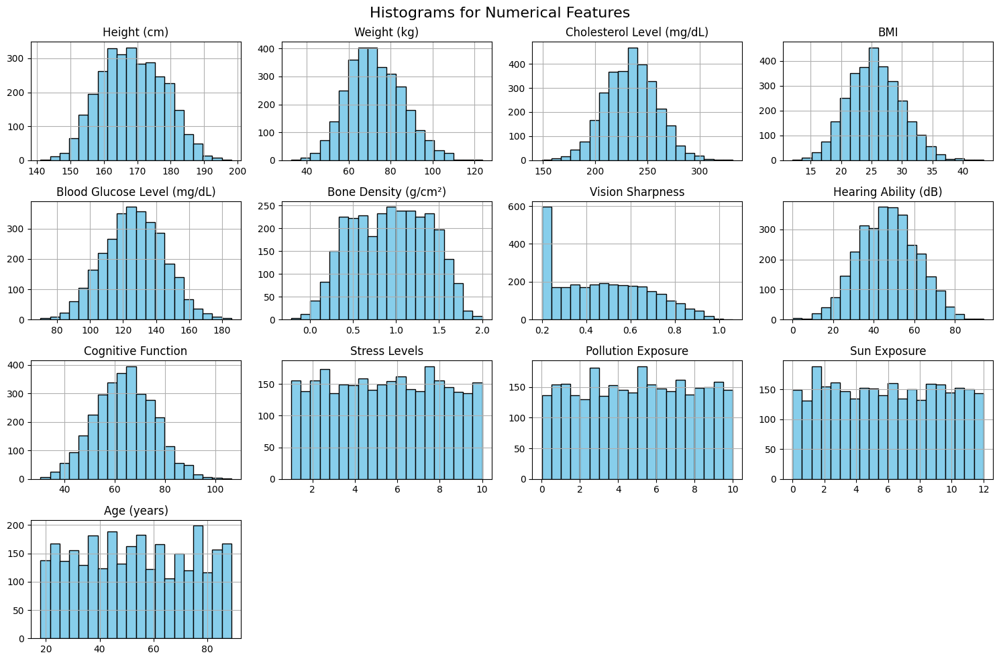

In [ ]:
# Select numerical data
numerical_data = age.select_dtypes(include=['float64', 'int64'])

# Plot histograms for all numerical columns
numerical_data.hist(figsize=(15, 10), bins=20, color='skyblue', edgecolor='black')
plt.suptitle('Histograms for Numerical Features', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
# Calculate skewness for all numerical columns
skewness = numerical_data.skew()
print("Skewness of numerical features:\n", skewness)

Skewness of numerical features:
 Height (cm)                    0.098341
Weight (kg)                    0.273367
Cholesterol Level (mg/dL)      0.045559
BMI                            0.221698
Blood Glucose Level (mg/dL)    0.016930
Bone Density (g/cm²)          -0.034829
Vision Sharpness               0.307053
Hearing Ability (dB)           0.025523
Cognitive Function             0.053966
Stress Levels                  0.003204
Pollution Exposure            -0.012861
Sun Exposure                   0.017905
Age (years)                    0.024675
dtype: float64


<ipython-input-12-ad844f29813a>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=categorical_data, x=column, palette='viridis',
<ipython-input-12-ad844f29813a>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=categorical_data, x=column, palette='viridis',
<ipython-input-12-ad844f29813a>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=categorical_data, x=column, palette='viridis',


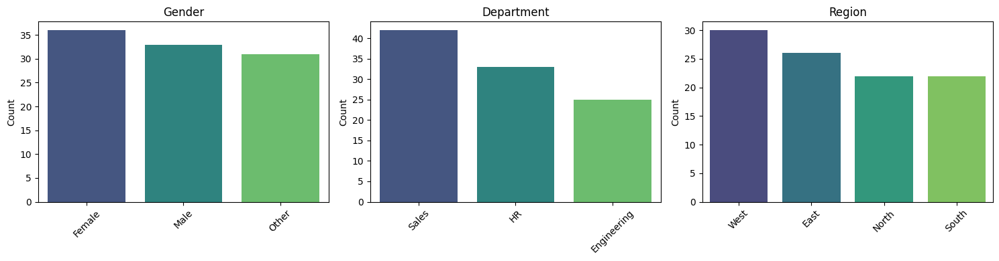

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Simulate categorical_data DataFrame for demonstration purposes
np.random.seed(42)
categorical_data = pd.DataFrame({
    'Gender': np.random.choice(['Male', 'Female', 'Other'], size=100),
    'Department': np.random.choice(['HR', 'Engineering', 'Sales'], size=100),
    'Region': np.random.choice(['North', 'South', 'East', 'West'], size=100)
})

# Define the number of columns for the grid layout
num_cols = 3  # Adjust for more/less columns per row
num_plots = len(categorical_data.columns)
num_rows = (num_plots + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))
axes = axes.flatten()

# Plot each feature in the grid
for i, column in enumerate(categorical_data.columns):
    sns.countplot(data=categorical_data, x=column, palette='viridis',
                  order=categorical_data[column].value_counts().index, ax=axes[i])
    axes[i].set_title(f'{column}', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("Count")

# Hide any unused subplots
for i in range(num_plots, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Determine whether the blood pressure is string or not?
print(age['Blood Pressure (s/d)'].unique())

['151/109' '134/112' '160/101' ... '144/98' '110/78' '167/91']


In [ ]:
# Split Blood Pressure into Systolic and Diastolic
age[['Systolic', 'Diastolic']] = age['Blood Pressure (s/d)'].str.split('/', expand=True)

# Convert them to numeric
age['Systolic'] = pd.to_numeric(age['Systolic'], errors='coerce')
age['Diastolic'] = pd.to_numeric(age['Diastolic'], errors='coerce')

# Verify the results
print(age[['Systolic', 'Diastolic']].head())


   Systolic  Diastolic
0       151        109
1       134        112
2       160        101
3       133         94
4       170        106


In [ ]:
# Define a function to categorize blood pressure
def categorize_blood_pressure(systolic, diastolic):
    if systolic < 120 and diastolic < 80:
        return 'Normal'
    elif 120 <= systolic <= 129 and diastolic < 80:
        return 'Elevated'
    elif 130 <= systolic <= 139 or 80 <= diastolic <= 89:
        return 'Hypertension Stage 1'
    elif systolic >= 140 or diastolic >= 90:
        return 'Hypertension Stage 2'
    else:
        return 'Other'

# Apply the function
age['Blood Pressure Category'] = age.apply(lambda row: categorize_blood_pressure(row['Systolic'], row['Diastolic']), axis=1)

# Verify the categories
print(age['Blood Pressure Category'].value_counts())


Blood Pressure Category
Hypertension Stage 2    1842
Hypertension Stage 1    1102
Elevated                  36
Normal                    20
Name: count, dtype: int64


<ipython-input-16-7f4811e1636c>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=age, x='Blood Pressure Category', palette='viridis', order=age['Blood Pressure Category'].value_counts().index)


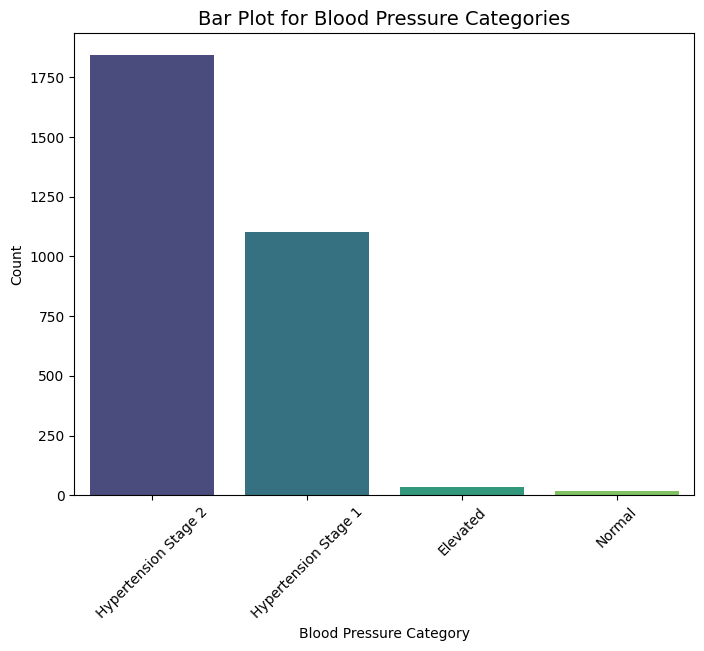

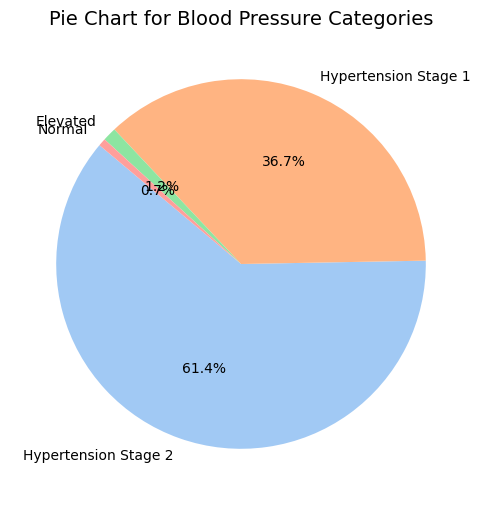

In [ ]:
# Bar Plot for Blood Pressure Categories
plt.figure(figsize=(8, 6))
sns.countplot(data=age, x='Blood Pressure Category', palette='viridis', order=age['Blood Pressure Category'].value_counts().index)
plt.title('Bar Plot for Blood Pressure Categories', fontsize=14)
plt.xlabel('Blood Pressure Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Pie Chart for Blood Pressure Categories
blood_pressure_counts = age['Blood Pressure Category'].value_counts()
plt.figure(figsize=(8, 6))
plt.pie(blood_pressure_counts, labels=blood_pressure_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
plt.title('Pie Chart for Blood Pressure Categories', fontsize=14)
plt.show()


In [ ]:
# Define dependent and independent variables
X = numerical_data.drop(columns=['Age (years)']) # Independent Variable
y = numerical_data['Age (years)']  # Dependent variable

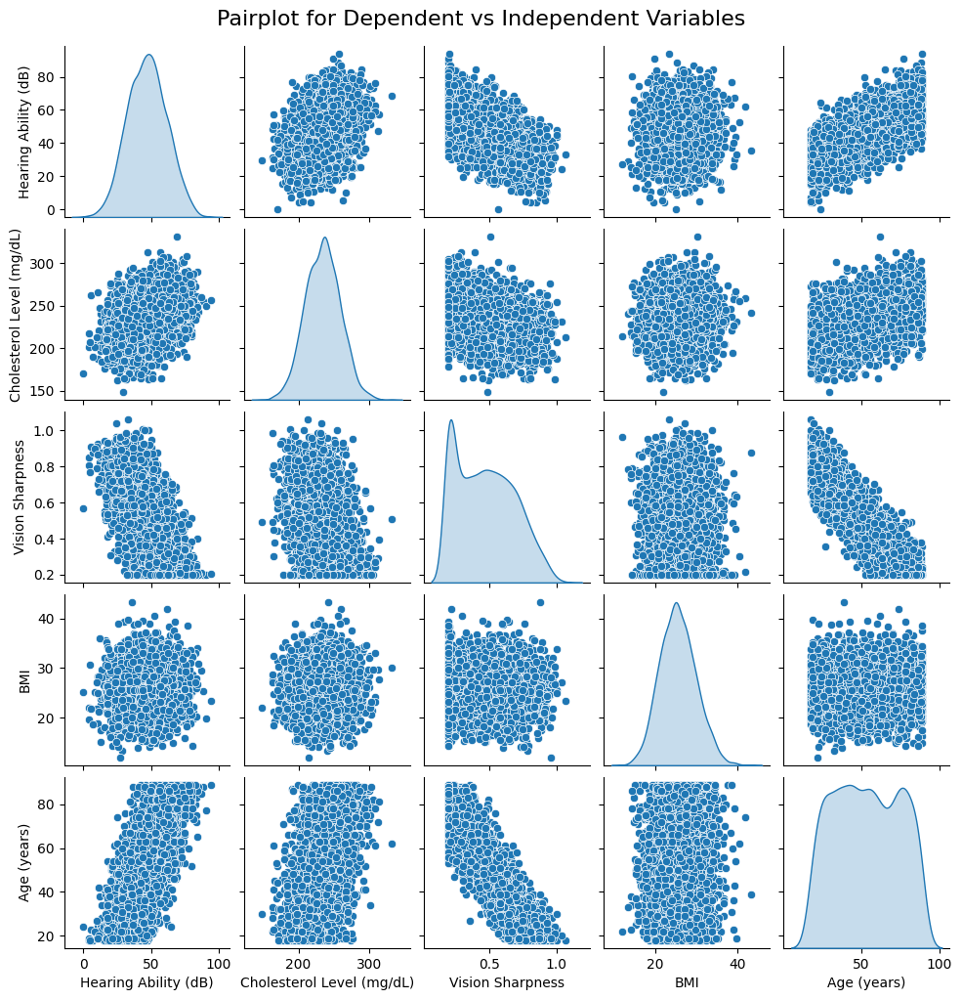

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Specify the features for the pairplot
selected_features = ['Hearing Ability (dB)', 'Cholesterol Level (mg/dL)', 'Vision Sharpness', 'BMI', 'Age (years)']

# Create a pairplot with smaller subplot sizes
sns.pairplot(age[selected_features], diag_kind='kde', kind='scatter', height=2)  # Adjust 'height' to make it smaller
plt.suptitle('Pairplot for Dependent vs Independent Variables', y=1.02, fontsize=16)
plt.show()


# Preprocessing


In [ ]:
# Step 1 : Check for missing values
print(age.isnull().sum())

# Missing values count and percentage
missing_values = age.isnull().sum()
missing_percentage = (missing_values / len(age)) * 100

# Display missing values
print("\nMissing Values in Training Data:")
print(pd.DataFrame({"Missing Count": missing_values, "Percentage": missing_percentage}))


Gender                            0
Height (cm)                       0
Weight (kg)                       0
Blood Pressure (s/d)              0
Cholesterol Level (mg/dL)         0
BMI                               0
Blood Glucose Level (mg/dL)       0
Bone Density (g/cm²)              0
Vision Sharpness                  0
Hearing Ability (dB)              0
Physical Activity Level           0
Smoking Status                    0
Alcohol Consumption            1201
Diet                              0
Chronic Diseases               1299
Medication Use                 1198
Family History                 1451
Cognitive Function                0
Mental Health Status              0
Sleep Patterns                    0
Stress Levels                     0
Pollution Exposure                0
Sun Exposure                      0
Education Level                 627
Income Level                      0
Age (years)                       0
Age Group                         0
Systolic                    

In [ ]:
# The missing values are assumed to represent no alcohol comsumption
age['Alcohol Consumption'] = age['Alcohol Consumption'].fillna('None')

# The missing values are assumed to represent no midication use
age['Medication Use'] = age['Medication Use'].fillna('None')

# The missing values are assumed to represent no family history
age['Family History'] = age['Family History'].fillna('None')

# The missing values are assumed to represent no education level
age['Education Level'] = age['Education Level'].fillna('None')

# The missing values are assumed to represent no chronic diseases
age['Chronic Diseases'] = age['Chronic Diseases'].fillna('None')

# Check again to ensure no missing values remain
print(age.isnull().sum())

Gender                         0
Height (cm)                    0
Weight (kg)                    0
Blood Pressure (s/d)           0
Cholesterol Level (mg/dL)      0
BMI                            0
Blood Glucose Level (mg/dL)    0
Bone Density (g/cm²)           0
Vision Sharpness               0
Hearing Ability (dB)           0
Physical Activity Level        0
Smoking Status                 0
Alcohol Consumption            0
Diet                           0
Chronic Diseases               0
Medication Use                 0
Family History                 0
Cognitive Function             0
Mental Health Status           0
Sleep Patterns                 0
Stress Levels                  0
Pollution Exposure             0
Sun Exposure                   0
Education Level                0
Income Level                   0
Age (years)                    0
Age Group                      0
Systolic                       0
Diastolic                      0
Blood Pressure Category        0
dtype: int

In [ ]:
# Identify Missing Data
missing_values = age.isnull().sum()
print("Missing Values in Each Column:")
print(missing_values)

Missing Values in Each Column:
Gender                         0
Height (cm)                    0
Weight (kg)                    0
Blood Pressure (s/d)           0
Cholesterol Level (mg/dL)      0
BMI                            0
Blood Glucose Level (mg/dL)    0
Bone Density (g/cm²)           0
Vision Sharpness               0
Hearing Ability (dB)           0
Physical Activity Level        0
Smoking Status                 0
Alcohol Consumption            0
Diet                           0
Chronic Diseases               0
Medication Use                 0
Family History                 0
Cognitive Function             0
Mental Health Status           0
Sleep Patterns                 0
Stress Levels                  0
Pollution Exposure             0
Sun Exposure                   0
Education Level                0
Income Level                   0
Age (years)                    0
Age Group                      0
Systolic                       0
Diastolic                      0
Blood Pressu

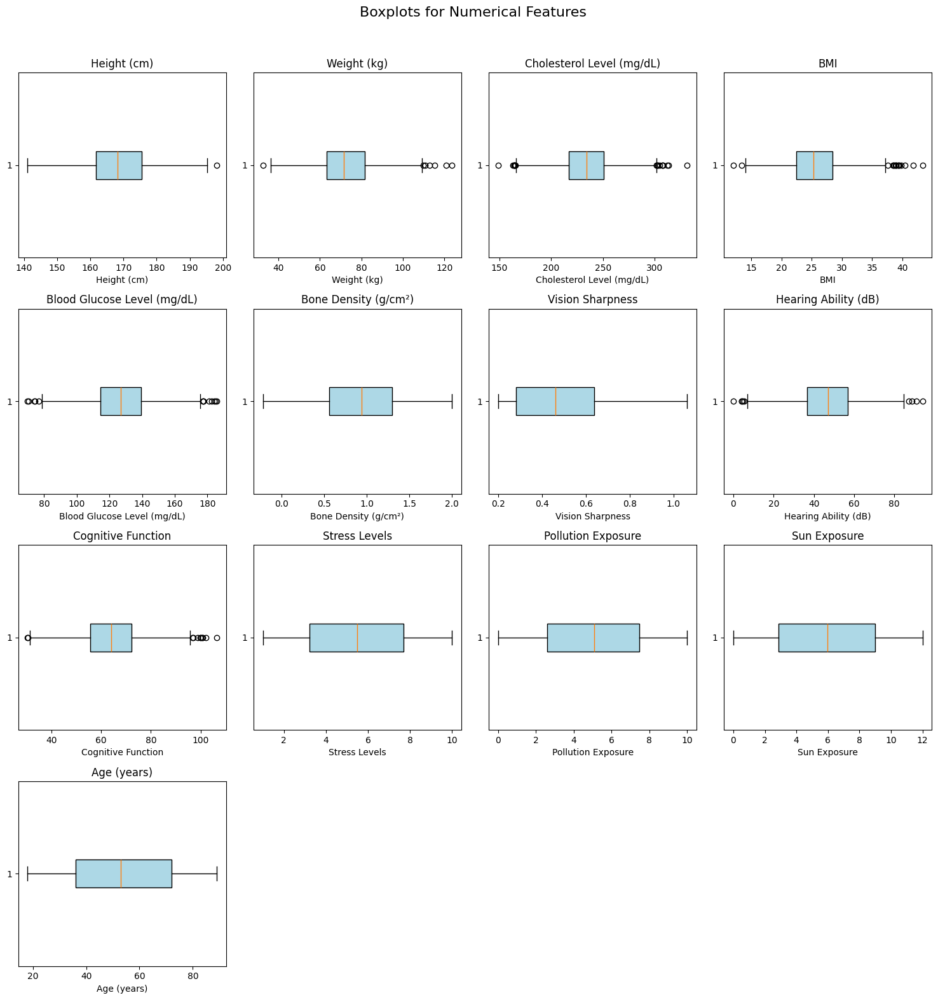

In [ ]:
import matplotlib.pyplot as plt
import math

# Calculate the number of rows and columns for subplots
num_columns = numerical_data.shape[1]
cols = 4  # Number of columns for the grid
rows = math.ceil(num_columns / cols)  # Calculate required rows

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()  # Flatten to iterate easily

# Plot each boxplot in a subplot
for i, column in enumerate(numerical_data.columns):
    axes[i].boxplot(numerical_data[column].dropna(), vert=False, patch_artist=True,
                    boxprops=dict(facecolor='lightblue'))
    axes[i].set_title(f'{column}', fontsize=12)
    axes[i].set_xlabel(column)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add overall title and adjust layout
plt.suptitle('Boxplots for Numerical Features', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for the title
plt.show()


In [ ]:
# Caping the boxplot to overcome the outlier
def cap_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[column] = df[column].clip(lower=lower_bound, upper=upper_bound)
    return df

for col in numerical_data.columns:
    cap_outliers(numerical_data, col)


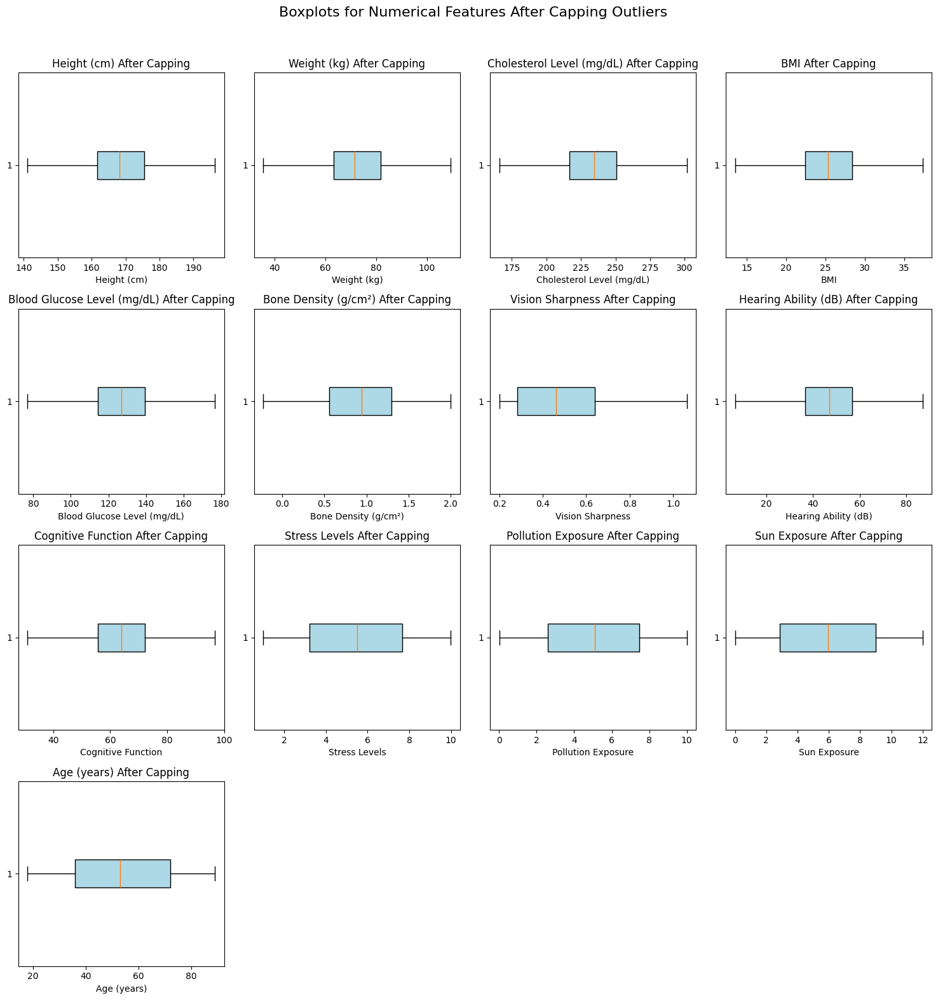

In [ ]:
import matplotlib.pyplot as plt
import math

# Calculate the number of rows and columns for subplots
num_columns = numerical_data.shape[1]
cols = 4  # Number of columns for the grid
rows = math.ceil(num_columns / cols)  # Calculate required rows

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()  # Flatten to iterate easily

# Plot each boxplot for capped values
for i, column in enumerate(numerical_data.columns):
    # Assuming outlier capping is done on the column; for example, using IQR method
    # Replace this with your actual capped data if available
    capped_data = numerical_data[column].dropna()  # This should be your capped data

    axes[i].boxplot(capped_data, vert=False, patch_artist=True,
                    boxprops=dict(facecolor='lightblue'))
    axes[i].set_title(f'{column} After Capping', fontsize=12)
    axes[i].set_xlabel(column)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add overall title and adjust layout
plt.suptitle('Boxplots for Numerical Features After Capping Outliers', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for the title
plt.show()


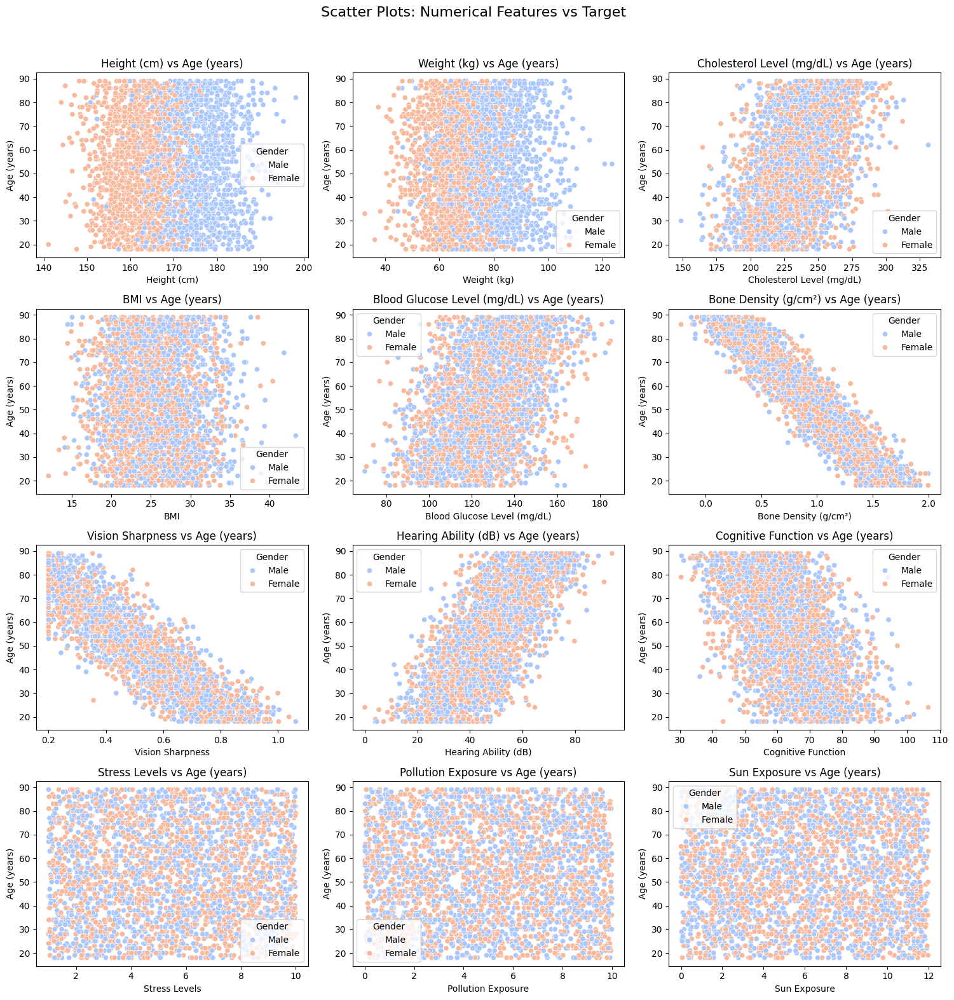

In [ ]:
# Scatter Plots (Numerical Features vs. Target)
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Define the target column
target_column = 'Age (years)'

# Ensure the target column exists in the dataset
if target_column in age.columns:
    # Set up grid layout for scatter plots
    num_columns = len(numerical_data.columns) - 1  # Exclude the target column
    cols = 3  # Number of columns for the grid
    rows = math.ceil(num_columns / cols)  # Calculate rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
    axes = axes.flatten()

    # Plot each scatter plot in the grid
    for i, column in enumerate(numerical_data.columns):
        if column != target_column:  # Skip the target column
            sns.scatterplot(ax=axes[i], x=age[column], y=age[target_column], hue=age['Gender'], palette='coolwarm')
            axes[i].set_title(f'{column} vs {target_column}', fontsize=12)
            axes[i].set_xlabel(column, fontsize=10)
            axes[i].set_ylabel(target_column, fontsize=10)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle('Scatter Plots: Numerical Features vs Target', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

else:
    print(f"The target column '{target_column}' does not exist in the dataset.")


<ipython-input-26-25900c8eb903>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[i], x=age[column], y=age[target_column], palette='viridis')
<ipython-input-26-25900c8eb903>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[i], x=age[column], y=age[target_column], palette='viridis')
<ipython-input-26-25900c8eb903>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[i], x=age[column], y=age[target_column], palette='viridis')
<ipython-input-26-25900c8eb903>:15: FutureWarning: 

Passing `palette` without assigning `hue` is

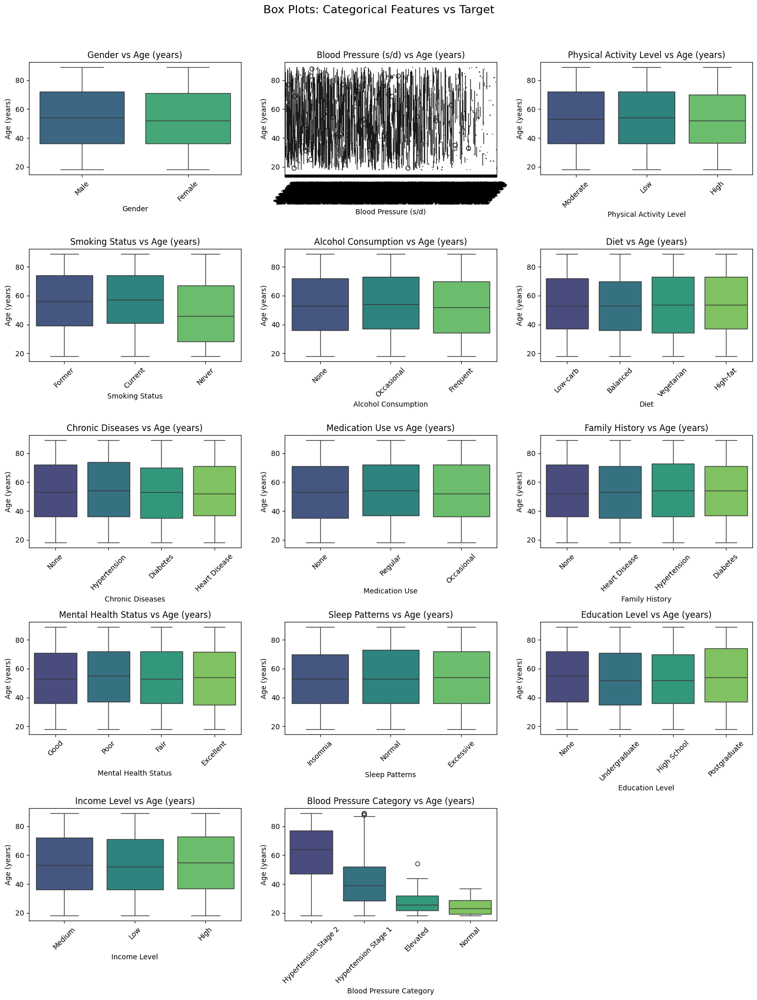

In [ ]:
# Box plots for categorical features vs target
if target_column in age.columns:
    categorical_features = age.select_dtypes(include=['object']).columns

    # Set up grid layout for box plots
    num_categories = len(categorical_features)
    cols = 3  # Number of columns for the grid
    rows = math.ceil(num_categories / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
    axes = axes.flatten()

    # Plot each box plot in the grid
    for i, column in enumerate(categorical_features):
        sns.boxplot(ax=axes[i], x=age[column], y=age[target_column], palette='viridis')
        axes[i].set_title(f'{column} vs {target_column}', fontsize=12)
        axes[i].set_xlabel(column, fontsize=10)
        axes[i].set_ylabel(target_column, fontsize=10)
        axes[i].tick_params(axis='x', rotation=45)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle('Box Plots: Categorical Features vs Target', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
else:
    print(f"The target column '{target_column}' does not exist in the dataset.")


In [ ]:
# Step 3: Contaminated Data
# Check for invalid or contaminated data
valid_ranges = {
    'Height (cm)': (50, 250),
    'Age (years)': (0, 120),
    'Weight (kg)': (10, 300),
    'BMI': (10, 50),
    'Bone Density (g/cm²)': (0, 2),
    'Blood Glucose Level (mg/dL)': (50, 300),
    'Cholesterol Level (mg/dL)': (100, 400),
}

# Apply the valid ranges to filter the dataset
for column, (min_val, max_val) in valid_ranges.items():
    if column in age.columns:
        age = age[(age[column] >= min_val) & (age[column] <= max_val)]

print("Dataset after checking for invalid or contaminated data:\n", age.head())

# Check for unexpected categorical values
for column in categorical_features:
    print(f"Unique values in {column}:\n", age[column].unique())


Dataset after checking for invalid or contaminated data:
    Gender  Height (cm)  Weight (kg) Blood Pressure (s/d)  \
0    Male   171.148359    86.185197              151/109   
1    Male   172.946206    79.641937              134/112   
2  Female   155.945488    49.167058              160/101   
3  Female   169.078298    56.017921               133/94   
4  Female   163.758355    73.966304              170/106   

   Cholesterol Level (mg/dL)        BMI  Blood Glucose Level (mg/dL)  \
0                 259.465814  29.423017                   157.652848   
1                 263.630292  26.626847                   118.507805   
2                 207.846206  20.217553                   143.587550   
3                 253.283779  19.595270                   137.448581   
4                 236.119899  27.582078                   145.328695   

   Bone Density (g/cm²)  Vision Sharpness  Hearing Ability (dB)  ...  \
0              0.132868          0.200000             58.786198  ...   
1   

In [ ]:
# Step 4: Inconsistent Data

# Predefine valid categories for all categorical features
valid_categories = {
    'gender': ['male', 'female'],
    'blood pressure category': ['hypertension stage 1', 'hypertension stage 2', 'elevated', 'normal'],
    'smoking status': ['former', 'current', 'never'],
    'alcohol consumption': ['none', 'occasional', 'frequent'],
    'physical activity level': ['moderate', 'low', 'high'],
    'diet': ['low-carb', 'balanced', 'vegetarian', 'high-fat'],
    'chronic diseases': ['none', 'hypertension', 'diabetes', 'heart disease'],
    'medication use': ['none', 'regular', 'occasional'],
    'family history': ['none', 'heart disease', 'hypertension', 'diabetes'],
    'mental health status': ['good', 'poor', 'fair', 'excellent'],
    'sleep patterns': ['insomnia', 'normal', 'excessive'],
    'education level': ['none', 'undergraduate', 'high school', 'postgraduate'],
    'income level': ['low', 'medium', 'high'],
    # Add any additional features and their valid categories as needed
}

# Step 1: Standardize categorical data (convert to lowercase, remove whitespace)
for column in categorical_features:
    age[column] = age[column].str.lower().str.strip()

# Step 2: Validate and correct categorical features
for column in categorical_features:
    if column in valid_categories:
        # Check for inconsistent values
        inconsistent_values = age[~age[column].isin(valid_categories[column])]
        print(f"\nInconsistent entries in '{column}':")
        print(inconsistent_values)

        # Correct inconsistent values (replace invalid values with 'unknown')
        age[column] = age[column].apply(
            lambda x: x if x in valid_categories[column] else 'unknown'
        )

# Step 3: Display unique values after resolving inconsistencies
print("\nUnique values after resolving inconsistencies:")
for column in categorical_features:
    print(f"{column}: {age[column].unique()}")



Unique values after resolving inconsistencies:
Gender: ['male' 'female']
Blood Pressure (s/d): ['151/109' '134/112' '160/101' ... '144/98' '110/78' '167/91']
Physical Activity Level: ['moderate' 'low' 'high']
Smoking Status: ['former' 'current' 'never']
Alcohol Consumption: ['none' 'occasional' 'frequent']
Diet: ['low-carb' 'balanced' 'vegetarian' 'high-fat']
Chronic Diseases: ['none' 'hypertension' 'diabetes' 'heart disease']
Medication Use: ['none' 'regular' 'occasional']
Family History: ['none' 'heart disease' 'hypertension' 'diabetes']
Mental Health Status: ['good' 'poor' 'fair' 'excellent']
Sleep Patterns: ['insomnia' 'normal' 'excessive']
Education Level: ['none' 'undergraduate' 'high school' 'postgraduate']
Income Level: ['medium' 'low' 'high']
Blood Pressure Category: ['hypertension stage 2' 'hypertension stage 1' 'elevated' 'normal']


In [ ]:
# Step 5 : Invalid Data
# Create a DataFrame to store all cleaned (invalid) data
cleaned_data = pd.DataFrame()

# Step 1: Validate Blood Pressure
def validate_blood_pressure(row):
    try:
        systolic, diastolic = map(int, row.split('/'))
        return systolic > diastolic
    except:
        return False

# Identify invalid blood pressure rows
invalid_bp_rows = age[~age['Blood Pressure (s/d)'].apply(validate_blood_pressure)]
print("Invalid Blood Pressure Entries:\n", invalid_bp_rows)

# Add to cleaned data
cleaned_data = pd.concat([cleaned_data, invalid_bp_rows])

# Remove invalid rows
age = age[age['Blood Pressure (s/d)'].apply(validate_blood_pressure)]

# Step 2: Validate BMI Consistency
age['Calculated BMI'] = age['Weight (kg)'] / ((age['Height (cm)'] / 100) ** 2)
invalid_bmi_rows = age[(age['BMI'] - age['Calculated BMI']).abs() > 2]
print("Invalid BMI Rows:\n", invalid_bmi_rows)

# Add to cleaned data
cleaned_data = pd.concat([cleaned_data, invalid_bmi_rows])

# Remove invalid rows
age = age.drop(invalid_bmi_rows.index)
age = age.drop(columns=['Calculated BMI'], errors='ignore')

# Step 3: Validate Ranges for All Numerical Features
valid_ranges = {
    'Height (cm)': (50, 250),
    'Age (years)': (0, 120),
    'Weight (kg)': (10, 300),
    'BMI': (10, 50),
    'Bone Density (g/cm²)': (0, 2),
    'Blood Glucose Level (mg/dL)': (50, 300),
    'Cholesterol Level (mg/dL)': (100, 400),
}

for column, (min_val, max_val) in valid_ranges.items():
    if column in age.columns:
        invalid_range_rows = age[(age[column] < min_val) | (age[column] > max_val)]
        print(f"Invalid {column} Rows:\n", invalid_range_rows)

        # Add to cleaned data
        cleaned_data = pd.concat([cleaned_data, invalid_range_rows])

        # Remove invalid rows
        age = age[(age[column] >= min_val) & (age[column] <= max_val)]

# Step 4: Validate Categorical Features
valid_categories = {
    'gender': ['male', 'female'],
    'blood pressure category': ['hypertension stage 1', 'hypertension stage 2', 'elevated', 'normal'],
    'smoking status': ['former', 'current', 'never'],
    'alcohol consumption': ['none', 'occasional', 'frequent'],
    # Add more features as needed
}

for column, valid_values in valid_categories.items():
    if column in age.columns:
        invalid_categorical_rows = age[~age[column].isin(valid_values)]
        print(f"Invalid {column} Entries:\n", invalid_categorical_rows)

        # Add to cleaned data
        cleaned_data = pd.concat([cleaned_data, invalid_categorical_rows])

        # Correct invalid rows (replace invalid values with 'unknown')
        age[column] = age[column].apply(lambda x: x if x in valid_values else 'unknown')

# Step 5: Save or Print Cleaned Data
print("\nAll Cleaned Data (Invalid Rows):")
print(cleaned_data)

# Optionally, save cleaned data to a file
cleaned_data.to_csv("cleaned_data.csv", index=False)


Invalid Blood Pressure Entries:
 Empty DataFrame
Columns: [Gender, Height (cm), Weight (kg), Blood Pressure (s/d), Cholesterol Level (mg/dL), BMI, Blood Glucose Level (mg/dL), Bone Density (g/cm²), Vision Sharpness, Hearing Ability (dB), Physical Activity Level, Smoking Status, Alcohol Consumption, Diet, Chronic Diseases, Medication Use, Family History, Cognitive Function, Mental Health Status, Sleep Patterns, Stress Levels, Pollution Exposure, Sun Exposure, Education Level, Income Level, Age (years), Age Group, Systolic, Diastolic, Blood Pressure Category]
Index: []

[0 rows x 30 columns]
Invalid BMI Rows:
 Empty DataFrame
Columns: [Gender, Height (cm), Weight (kg), Blood Pressure (s/d), Cholesterol Level (mg/dL), BMI, Blood Glucose Level (mg/dL), Bone Density (g/cm²), Vision Sharpness, Hearing Ability (dB), Physical Activity Level, Smoking Status, Alcohol Consumption, Diet, Chronic Diseases, Medication Use, Family History, Cognitive Function, Mental Health Status, Sleep Patterns, Str

In [ ]:
# Step 6 : Duplicate Data
# Identify duplicate rows
duplicate_rows = age[age.duplicated()]
print(f"Number of duplicate rows: {duplicate_rows.shape[0]}")
print("\nDuplicate Rows:\n", duplicate_rows)


Number of duplicate rows: 0

Duplicate Rows:
 Empty DataFrame
Columns: [Gender, Height (cm), Weight (kg), Blood Pressure (s/d), Cholesterol Level (mg/dL), BMI, Blood Glucose Level (mg/dL), Bone Density (g/cm²), Vision Sharpness, Hearing Ability (dB), Physical Activity Level, Smoking Status, Alcohol Consumption, Diet, Chronic Diseases, Medication Use, Family History, Cognitive Function, Mental Health Status, Sleep Patterns, Stress Levels, Pollution Exposure, Sun Exposure, Education Level, Income Level, Age (years), Age Group, Systolic, Diastolic, Blood Pressure Category]
Index: []

[0 rows x 30 columns]


In [ ]:
# Step 7 : Data Type Issue
# Check the current data types
print("\nCurrent Data Types:")
print(age.dtypes)



Current Data Types:
Gender                           object
Height (cm)                     float64
Weight (kg)                     float64
Blood Pressure (s/d)             object
Cholesterol Level (mg/dL)       float64
BMI                             float64
Blood Glucose Level (mg/dL)     float64
Bone Density (g/cm²)            float64
Vision Sharpness                float64
Hearing Ability (dB)            float64
Physical Activity Level          object
Smoking Status                   object
Alcohol Consumption              object
Diet                             object
Chronic Diseases                 object
Medication Use                   object
Family History                   object
Cognitive Function              float64
Mental Health Status             object
Sleep Patterns                   object
Stress Levels                   float64
Pollution Exposure              float64
Sun Exposure                    float64
Education Level                  object
Income Level       

In [ ]:
# Step 8 : Structural Error
# Step 1: Inspect Column Names
print("\nColumn Names Before Correction:")
print(age.columns)

# Step 2: Standardize Column Names
age.columns = age.columns.str.strip().str.lower().str.replace(' ', '_')
print("\nColumn Names After Standardization:")
print(age.columns)

# Step 3: Drop Unnecessary Columns
columns_to_drop = ['unnecessary_column']  # Replace with actual column names
age = age.drop(columns=columns_to_drop, errors='ignore')

# Step 4: Remove Duplicated Columns
duplicated_columns = age.columns[age.columns.duplicated()]
print("\nDuplicated Columns:")
print(duplicated_columns)
age = age.loc[:, ~age.columns.duplicated()]

# Step 5: Check and Fix Indexing
if not age.index.is_unique:
    print("\nDuplicate Index Values Found. Resetting Index...")
    age = age.reset_index(drop=True)

print("\nDataset Index Info:")
print(age.index)

# Final Check
print("\nFinal Dataset Structure:")
print(age.info())



Column Names Before Correction:
Index(['Gender', 'Height (cm)', 'Weight (kg)', 'Blood Pressure (s/d)',
       'Cholesterol Level (mg/dL)', 'BMI', 'Blood Glucose Level (mg/dL)',
       'Bone Density (g/cm²)', 'Vision Sharpness', 'Hearing Ability (dB)',
       'Physical Activity Level', 'Smoking Status', 'Alcohol Consumption',
       'Diet', 'Chronic Diseases', 'Medication Use', 'Family History',
       'Cognitive Function', 'Mental Health Status', 'Sleep Patterns',
       'Stress Levels', 'Pollution Exposure', 'Sun Exposure',
       'Education Level', 'Income Level', 'Age (years)', 'Age Group',
       'Systolic', 'Diastolic', 'Blood Pressure Category'],
      dtype='object')

Column Names After Standardization:
Index(['gender', 'height_(cm)', 'weight_(kg)', 'blood_pressure_(s/d)',
       'cholesterol_level_(mg/dl)', 'bmi', 'blood_glucose_level_(mg/dl)',
       'bone_density_(g/cm²)', 'vision_sharpness', 'hearing_ability_(db)',
       'physical_activity_level', 'smoking_status', 'alcoho

# Exploratory Data Analysis


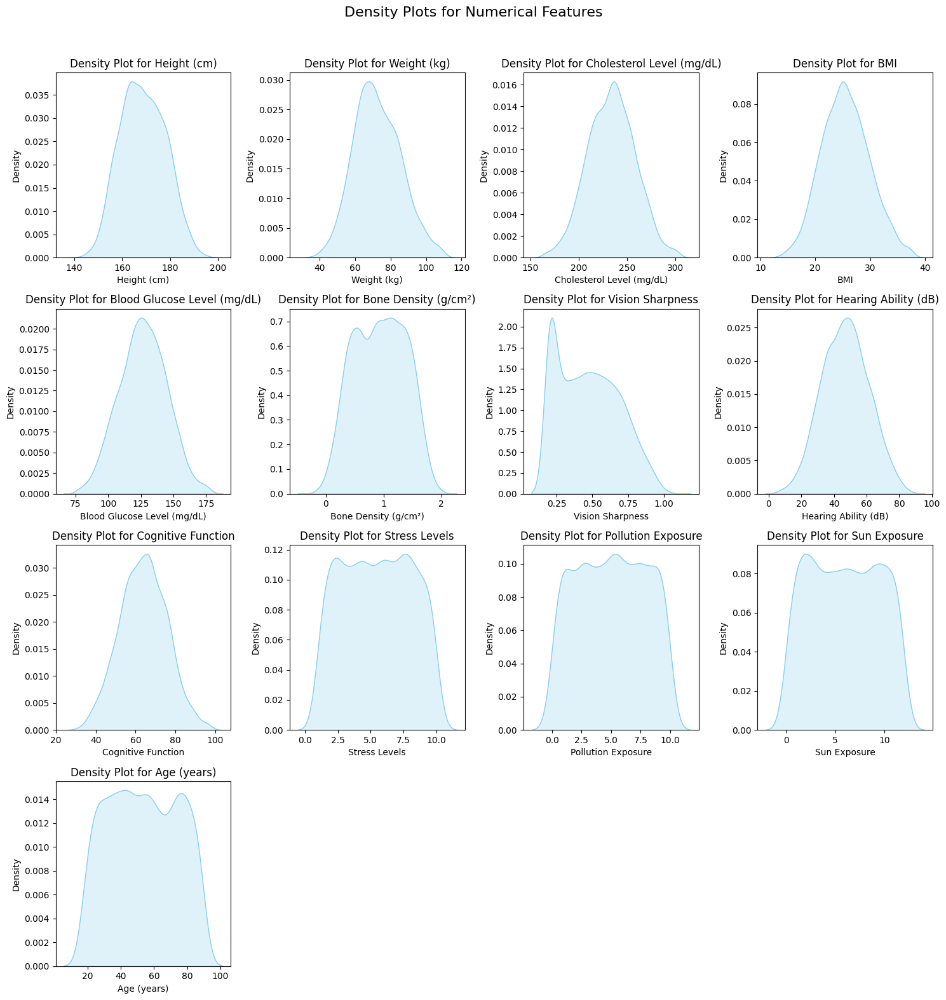

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Define the number of rows and columns for the grid
num_columns = len(numerical_data.columns)
cols = 4  # Number of columns in the grid
rows = math.ceil(num_columns / cols)  # Calculate the number of rows needed

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()  # Flatten the axes for easy iteration

# Plot each density plot in the grid
for i, column in enumerate(numerical_data.columns):
    sns.kdeplot(ax=axes[i], data=numerical_data[column], fill=True, color='skyblue')
    axes[i].set_title(f'Density Plot for {column}', fontsize=12)
    axes[i].set_xlabel(column, fontsize=10)
    axes[i].set_ylabel('Density', fontsize=10)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add an overall title and adjust layout
plt.suptitle('Density Plots for Numerical Features', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for the title
plt.show()


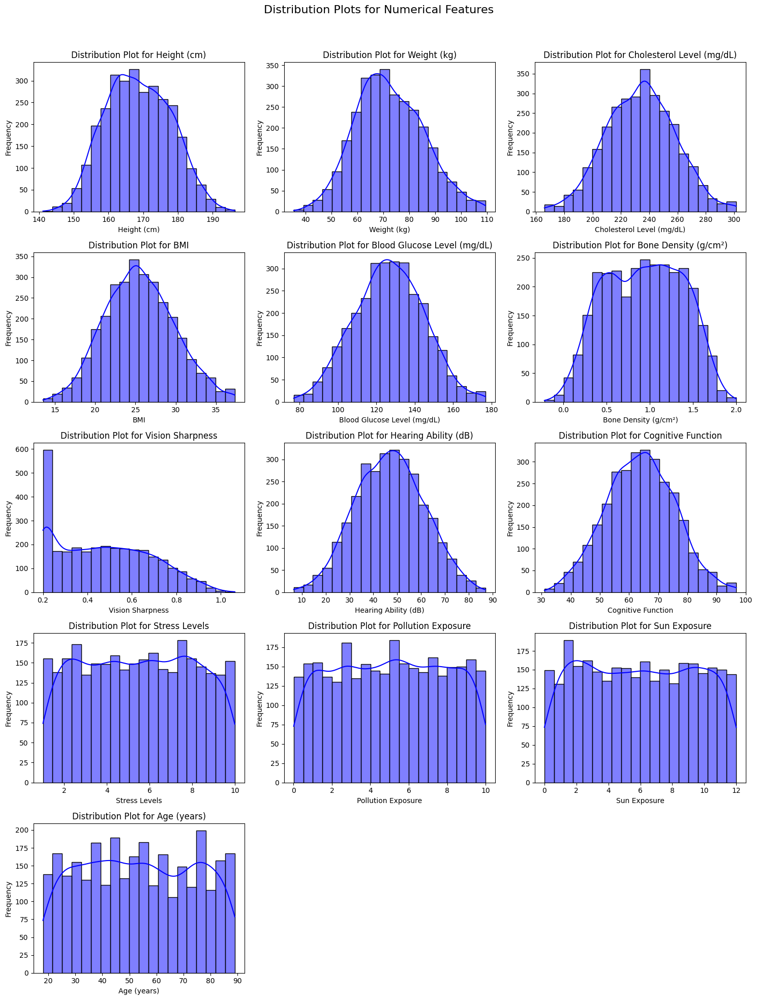

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Define the number of rows and columns for the grid
num_columns = len(numerical_data.columns)
cols = 3  # Number of columns in the grid
rows = math.ceil(num_columns / cols)  # Calculate the number of rows needed

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()  # Flatten the axes for easy iteration

# Plot each distribution plot in the grid
for i, column in enumerate(numerical_data.columns):
    sns.histplot(ax=axes[i], data=numerical_data[column], kde=True, color='blue', bins=20)
    axes[i].set_title(f'Distribution Plot for {column}', fontsize=12)
    axes[i].set_xlabel(column, fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=10)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add an overall title and adjust layout
plt.suptitle('Distribution Plots for Numerical Features', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for the title
plt.show()


# Feature Selection


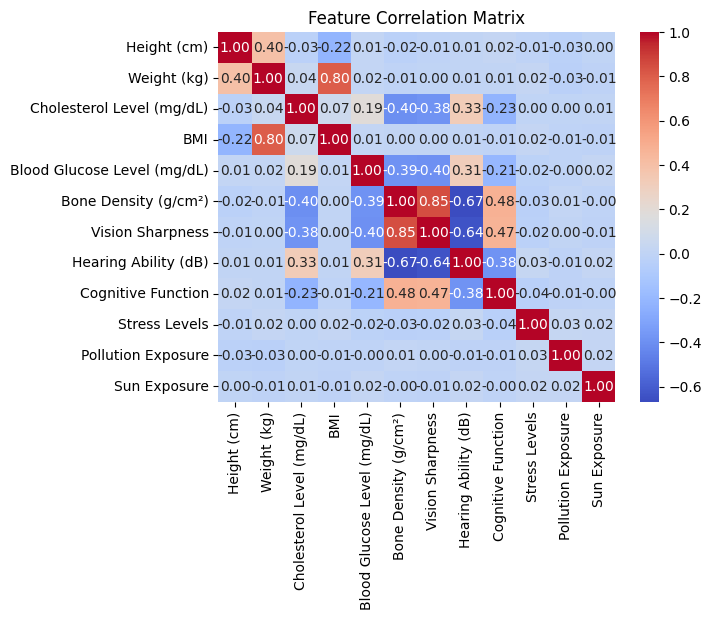

In [ ]:
# Check for Feature Redundancy
correlation_matrix = X.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Matrix")
plt.show()

In [ ]:
#  Lasso feature importance coefficients
from sklearn.linear_model import Lasso
lasso = Lasso(alpha=0.1)
lasso.fit(X, y)
print("Lasso Feature Importance:", lasso.coef_)

Lasso Feature Importance: [ 6.36795462e-03 -0.00000000e+00  3.90556765e-02 -3.67508541e-02
  5.16645612e-02 -2.60854648e+01 -2.60780408e+01  1.68475190e-01
 -8.85897022e-02 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00]


In [ ]:
non_numeric_columns = age.select_dtypes(include=['object']).columns
print("Non-Numeric Columns:", non_numeric_columns)


Non-Numeric Columns: Index(['gender', 'blood_pressure_(s/d)', 'physical_activity_level',
       'smoking_status', 'alcohol_consumption', 'diet', 'chronic_diseases',
       'medication_use', 'family_history', 'mental_health_status',
       'sleep_patterns', 'education_level', 'income_level',
       'blood_pressure_category'],
      dtype='object')


In [ ]:
# Scale numerical data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# Use only the values of numerical_data for scaling Standardization
scaled_numerical_data = scaler.fit_transform(numerical_data)

# Convert scaled data back to a DataFrame with original numerical column names
scaled_numerical_data = pd.DataFrame(scaled_numerical_data, columns=numerical_data.columns)

In [ ]:
# Combine the scaled numerical data with the original categorical data
combined_data = scaled_numerical_data.copy()
combined_data[categorical_data.columns] = categorical_data.reset_index(drop=True)

print("Combined Scaled Data:\n", combined_data.head())


Combined Scaled Data:
    Height (cm)  Weight (kg)  Cholesterol Level (mg/dL)       BMI  \
0     0.275371     1.038967                   1.042736  0.895998   
1     0.468904     0.541260                   1.213346  0.250727   
2    -1.361166    -1.776786                  -1.072018 -1.228343   
3     0.052537    -1.255681                   0.789470 -1.371947   
4    -0.520137     0.109548                   0.086299  0.471165   

   Blood Glucose Level (mg/dL)  Bone Density (g/cm²)  Vision Sharpness  \
0                     1.706424             -1.801746         -1.309503   
1                    -0.448026             -0.681807         -0.988497   
2                     0.932303             -1.033680         -1.077411   
3                     0.594429              0.569177          0.187074   
4                     1.028132             -1.121453         -0.799873   

   Hearing Ability (dB)  Cognitive Function  Stress Levels  \
0              0.822667           -1.689242      -1.036748   

<ipython-input-40-bae4df614043>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance_scaled.values, y=feature_importance_scaled.index, palette='viridis')


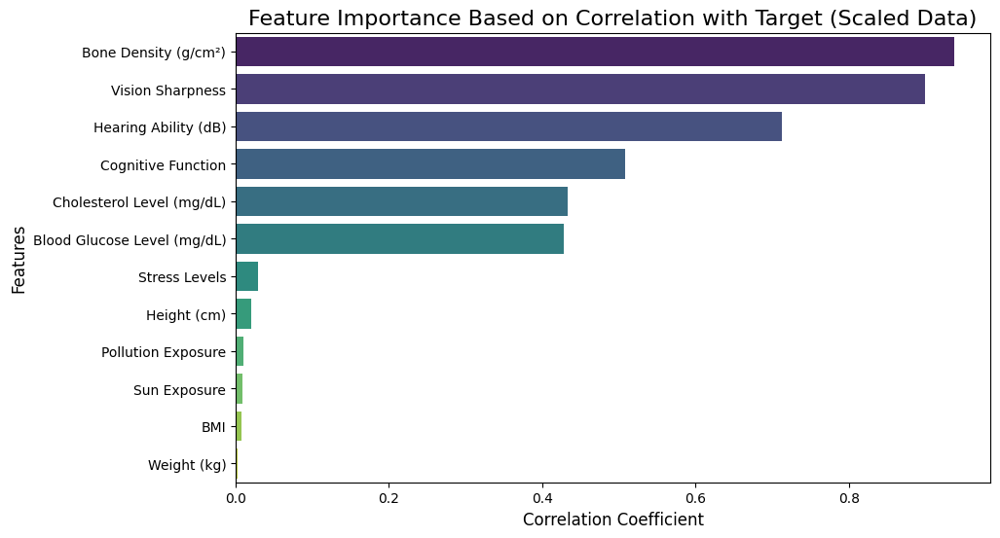

In [ ]:
# Calculate the correlation matrix on scaled data
scaled_correlation_matrix = scaled_numerical_data.corr()

# Define the target column (replace 'Age (years)' with the actual target column name if different)
target_column = 'Age (years)'

# Check if the target column exists in the scaled numerical data
if target_column in scaled_correlation_matrix.columns:
    # Extract correlation with the target and sort by absolute values
    feature_importance_scaled = scaled_correlation_matrix[target_column].drop(target_column).abs().sort_values(ascending=False)

    # Plot feature importance based on the scaled data
    plt.figure(figsize=(10, 6))
    sns.barplot(x=feature_importance_scaled.values, y=feature_importance_scaled.index, palette='viridis')
    plt.title('Feature Importance Based on Correlation with Target (Scaled Data)', fontsize=16)
    plt.xlabel('Correlation Coefficient', fontsize=12)
    plt.ylabel('Features', fontsize=12)
    plt.show()
else:
    print(f"The target column '{target_column}' is not in the scaled dataset. Please verify the column name.")



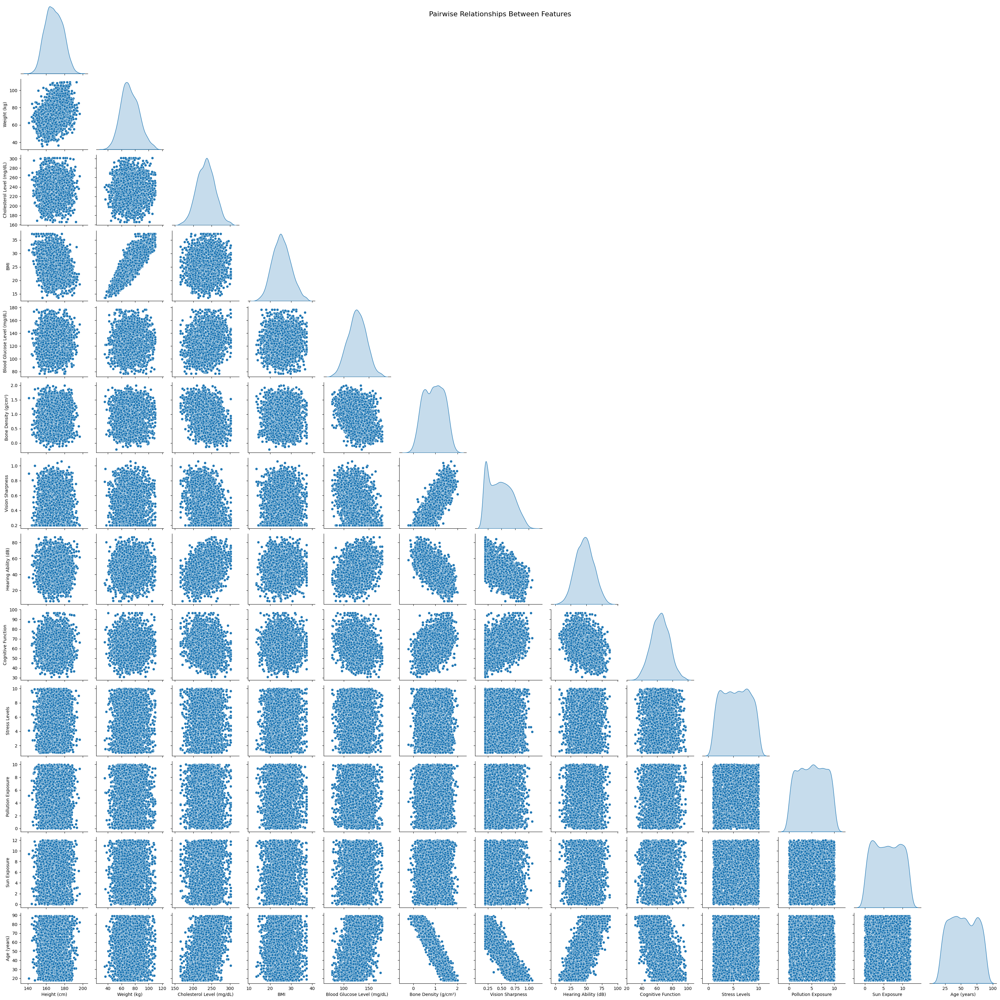

In [ ]:
# Pair Plot for Important Features with Target
sns.pairplot(data=numerical_data, diag_kind='kde', corner=True)
plt.suptitle('Pairwise Relationships Between Features', fontsize=16)
plt.show()

In [ ]:
path = "/content/drive/MyDrive/Train.csv"
age = pd.read_csv(path)

<ipython-input-44-ad58e84b7199>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], x=age['Gender'], y=age['Age (years)'], palette='viridis')


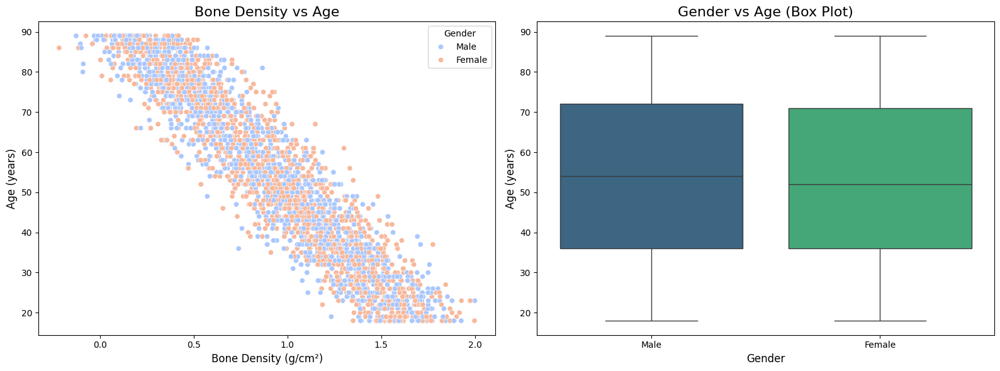

In [ ]:
# Create a 1x2 layout for the plots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Scatter Plot: Bone Density vs Age (years)
sns.scatterplot(ax=axes[0], x=age['Bone Density (g/cm²)'], y=age['Age (years)'],
                hue=age['Gender'], palette='coolwarm')
axes[0].set_title('Bone Density vs Age', fontsize=16)
axes[0].set_xlabel('Bone Density (g/cm²)', fontsize=12)
axes[0].set_ylabel('Age (years)', fontsize=12)

# Box Plot for Gender vs Age (years)
sns.boxplot(ax=axes[1], x=age['Gender'], y=age['Age (years)'], palette='viridis')
axes[1].set_title('Gender vs Age (Box Plot)', fontsize=16)
axes[1].set_xlabel('Gender', fontsize=12)
axes[1].set_ylabel('Age (years)', fontsize=12)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

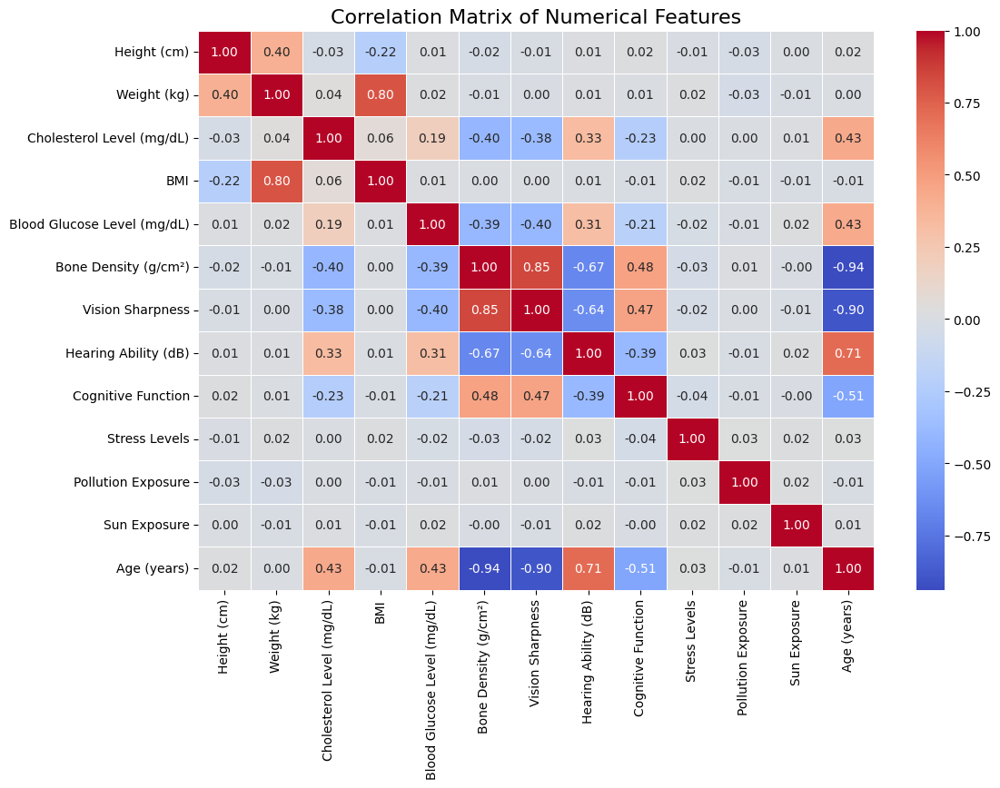

Features most correlated with Age (years):
 Age (years)                    1.000000
Hearing Ability (dB)           0.712741
Cholesterol Level (mg/dL)      0.433005
Blood Glucose Level (mg/dL)    0.428522
Stress Levels                  0.029093
Height (cm)                    0.020239
Sun Exposure                   0.009245
Weight (kg)                    0.002302
BMI                           -0.008080
Pollution Exposure            -0.010464
Cognitive Function            -0.508156
Vision Sharpness              -0.899692
Bone Density (g/cm²)          -0.937712
Name: Age (years), dtype: float64


<ipython-input-45-1b3a634c3005>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=correlation_with_age[top_features], y=top_features, palette='viridis')


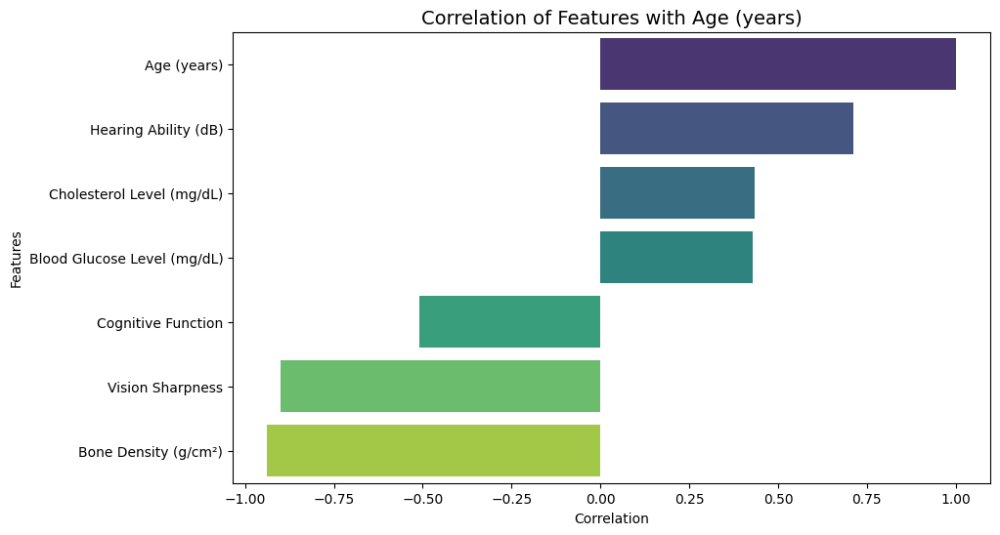

In [ ]:
# Calculate correlation matrix
correlation_matrix = numerical_data.corr()

# Display correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features', fontsize=16)
plt.show()

# Display the correlation of each feature with Age (years)
correlation_with_age = correlation_matrix['Age (years)'].sort_values(ascending=False)
print("Features most correlated with Age (years):\n", correlation_with_age)

# Visualize the top correlated features
top_features = correlation_with_age[correlation_with_age.abs() > 0.4].index  # Features with absolute correlation > 0.4
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation_with_age[top_features], y=top_features, palette='viridis')
plt.title('Correlation of Features with Age (years)', fontsize=14)
plt.xlabel('Correlation')
plt.ylabel('Features')
plt.show()

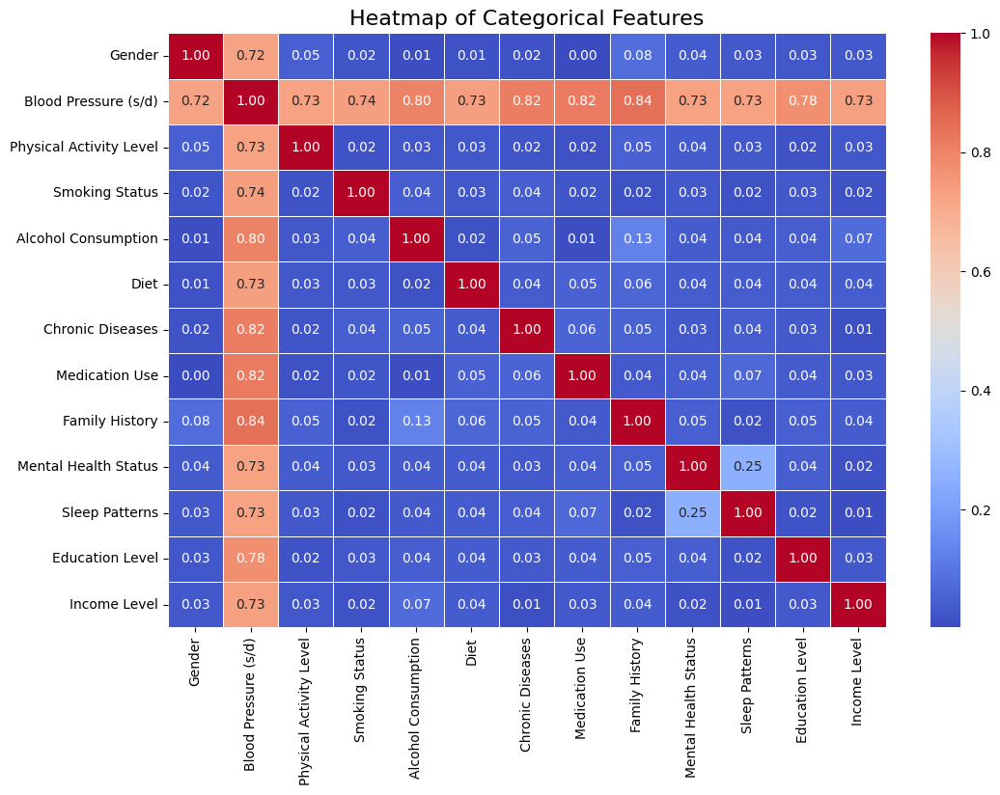

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# Function to calculate
def cramers_v(x, y):
    contingency_table = pd.crosstab(x, y)
    chi2 = chi2_contingency(contingency_table)[0]
    n = contingency_table.sum().sum()
    return np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1)))

# Select categorical columns
categorical_columns = age.select_dtypes(include='object').columns

# Compute pairwise Cramér's V
cramers_matrix = pd.DataFrame(index=categorical_columns, columns=categorical_columns)
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 == col2:
            cramers_matrix.loc[col1, col2] = 1.0  # Perfect correlation with itself
        else:
            cramers_matrix.loc[col1, col2] = cramers_v(age[col1], age[col2])

# Convert to float for heatmap
cramers_matrix = cramers_matrix.astype(float)

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(cramers_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Heatmap of Categorical Features', fontsize=16)
plt.show()


<ipython-input-47-3bc7997ae8ae>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=categorical_correlation_df, x='Correlation', y='Feature', palette='coolwarm')


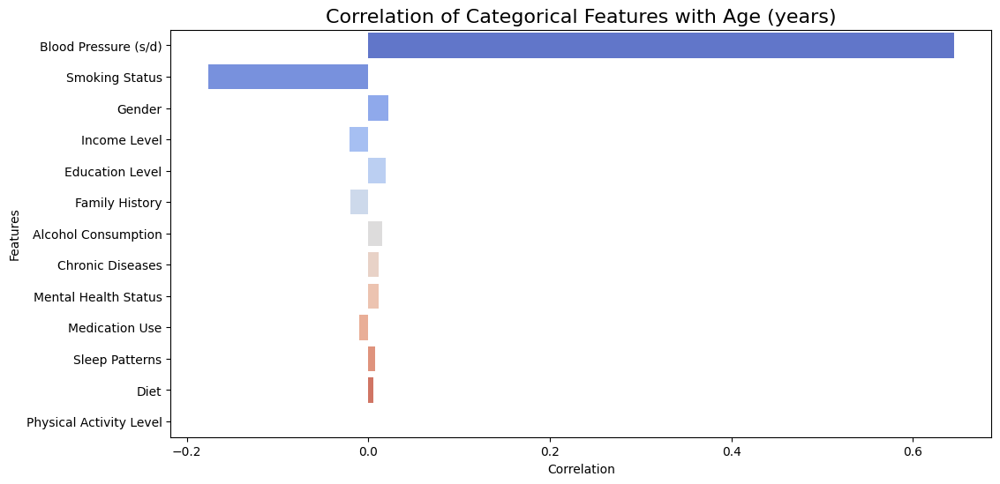

In [ ]:
from scipy.stats import pointbiserialr
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assume `age` is your DataFrame
categorical_columns = age.select_dtypes(include='object').columns  # Select categorical features
encoder = LabelEncoder()

# Calculate correlations with Age (years)
categorical_correlations = {}
for col in categorical_columns:
    age[col + '_encoded'] = encoder.fit_transform(age[col].astype(str))  # Encode categorical data
    correlation, _ = pointbiserialr(age[col + '_encoded'], age['Age (years)'])  # Correlation calculation
    categorical_correlations[col] = correlation

# Sort correlations
sorted_categorical_correlations = sorted(categorical_correlations.items(), key=lambda x: abs(x[1]), reverse=True)

# Convert to DataFrame for visualization
categorical_correlation_df = pd.DataFrame(sorted_categorical_correlations, columns=['Feature', 'Correlation'])

# Plot the bar chart
plt.figure(figsize=(12, 6))
sns.barplot(data=categorical_correlation_df, x='Correlation', y='Feature', palette='coolwarm')
plt.title('Correlation of Categorical Features with Age (years)', fontsize=16)
plt.xlabel('Correlation')
plt.ylabel('Features')
plt.show()


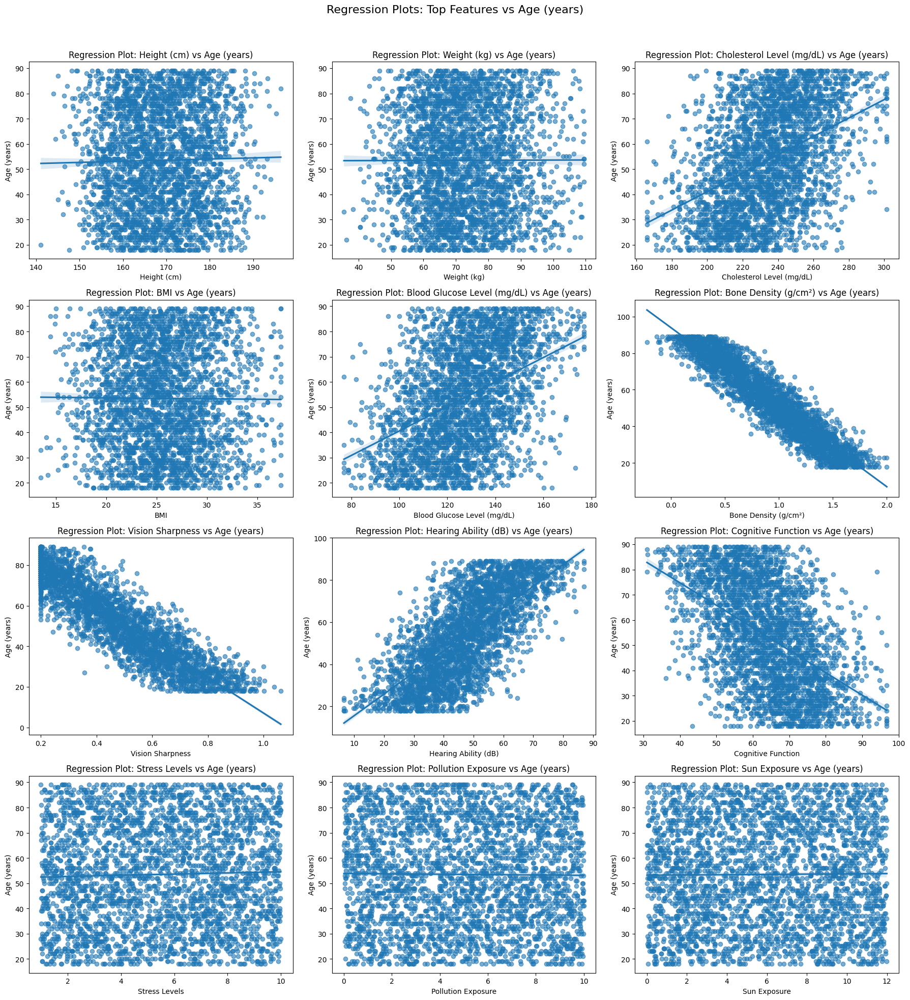

In [ ]:
# Ensure 'top_features' contains relevant numerical columns
top_features = [feature for feature in numerical_data.columns if feature != 'Age (years)']

# Define the number of rows and columns for the grid
num_columns = len(top_features)
cols = 3  # Number of columns in the grid
rows = math.ceil(num_columns / cols)  # Calculate the number of rows needed

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))  # Adjust figure size for 3 plots per row
axes = axes.flatten()  # Flatten the axes for easy iteration

# Generate regression plots
for i, feature in enumerate(top_features):
    sns.regplot(ax=axes[i], x=numerical_data[feature], y=numerical_data['Age (years)'], scatter_kws={'alpha': 0.6})
    axes[i].set_title(f'Regression Plot: {feature} vs Age (years)', fontsize=12)
    axes[i].set_xlabel(feature, fontsize=10)
    axes[i].set_ylabel('Age (years)', fontsize=10)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add an overall title and adjust layout
plt.suptitle('Regression Plots: Top Features vs Age (years)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for the title
plt.show()


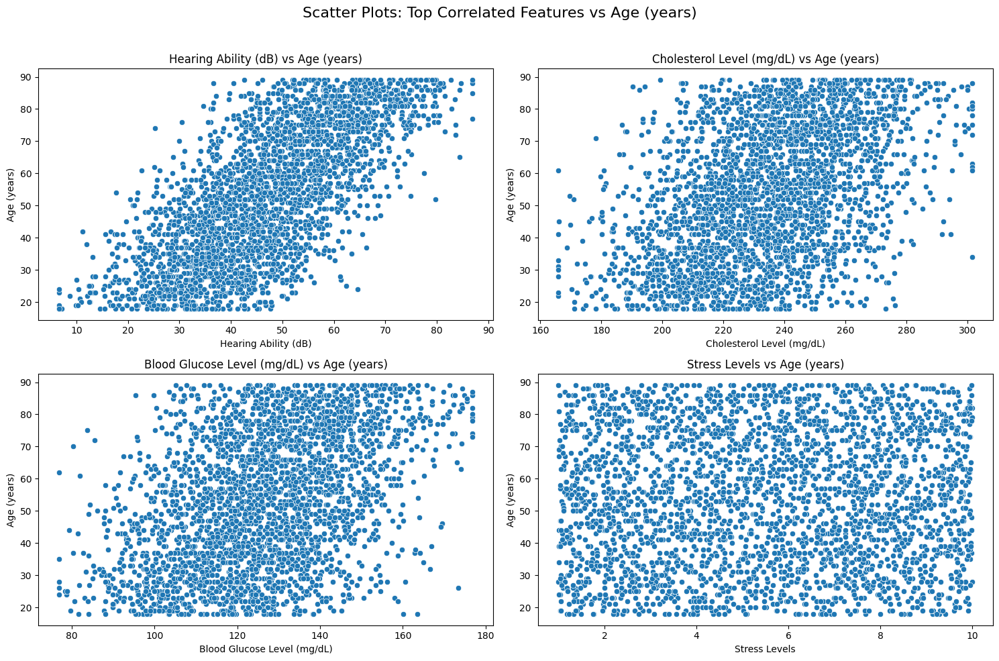

In [ ]:
# Top correlated features (excluding the target)
top_features = correlation_with_age.index[:5]  # Adjust index range as needed
top_features = [feature for feature in top_features if feature != 'Age (years)']

# Define the number of rows and columns for the grid
num_columns = len(top_features)
cols = 2  # Number of columns in the grid
rows = math.ceil(num_columns / cols)  # Calculate the number of rows needed

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))  # Adjust size for 2 plots per row
axes = axes.flatten()  # Flatten axes for easy iteration

# Generate scatter plots
for i, feature in enumerate(top_features):
    sns.scatterplot(ax=axes[i], x=numerical_data[feature], y=numerical_data['Age (years)'])
    axes[i].set_title(f'{feature} vs Age (years)', fontsize=12)
    axes[i].set_xlabel(feature, fontsize=10)
    axes[i].set_ylabel('Age (years)', fontsize=10)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add an overall title and adjust layout
plt.suptitle('Scatter Plots: Top Correlated Features vs Age (years)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for the title
plt.show()

In [ ]:
# Split Blood Pressure into Systolic and Diastolic
age[['Systolic', 'Diastolic']] = age['Blood Pressure (s/d)'].str.split('/', expand=True)

# Convert them to numeric
age['Systolic'] = pd.to_numeric(age['Systolic'], errors='coerce')
age['Diastolic'] = pd.to_numeric(age['Diastolic'], errors='coerce')

# Verify the results
print(age[['Systolic', 'Diastolic']].head())

   Systolic  Diastolic
0       151        109
1       134        112
2       160        101
3       133         94
4       170        106


In [ ]:
# 3D Scatter Plot: Bone Density, Blood Pressure, Age
import plotly.express as px
import pandas as pd

# Assuming 'age' DataFrame has relevant columns
fig = px.scatter_3d(
    age,
    x='Bone Density (g/cm²)',
    y='Systolic',
    z='Age (years)',
    color='Gender',  # Gender for coloring points
    color_discrete_map={'Male': 'blue', 'Female': 'red'},  # Customize colors
    title='3D Scatter Plot: Bone Density, Systolic BP, and Age'
)

# Customize the layout
fig.update_traces(marker=dict(size=5))  # Adjust marker size
fig.update_layout(
    scene=dict(
        xaxis_title='Bone Density (g/cm²)',
        yaxis_title='Systolic Blood Pressure',
        zaxis_title='Age (years)'
    ),
    margin=dict(l=0, r=0, b=0, t=50)  # Adjust margins
)

# Show the interactive plot
fig.show()



In [ ]:
# 3D Scatter Plot: Blood Glucose Level, BMI, and Age
import plotly.express as px

# Assuming 'age' DataFrame has the required columns
fig = px.scatter_3d(
    age,
    x='Blood Glucose Level (mg/dL)',
    y='BMI',
    z='Age (years)',
    color='Gender',  # Coloring points by Gender
    color_discrete_map={'Male': 'blue', 'Female': 'red'},  # Custom color map
    title='3D Scatter Plot: Blood Glucose Level, BMI, and Age'
)

# Customize the marker size and layout
fig.update_traces(marker=dict(size=5))  # Adjust marker size
fig.update_layout(
    scene=dict(
        xaxis_title='Blood Glucose Level (mg/dL)',
        yaxis_title='BMI',
        zaxis_title='Age (years)'
    ),
    margin=dict(l=0, r=0, b=0, t=50)  # Adjust margins
)

# Show the interactive plot
fig.show()



In [ ]:
# 3D Scatter Plot: Cholesterol Level, Bone Density, and Age
import plotly.express as px

# Assuming 'age' DataFrame has the required columns
fig = px.scatter_3d(
    age,
    x='Cholesterol Level (mg/dL)',
    y='Bone Density (g/cm²)',
    z='Age (years)',
    color='Gender',  # Coloring points by Gender
    color_discrete_map={'Male': 'blue', 'Female': 'red'},  # Custom color map
    title='3D Scatter Plot: Cholesterol Level, Bone Density, and Age'
)

# Customize the marker size and layout
fig.update_traces(marker=dict(size=5))  # Adjust marker size
fig.update_layout(
    scene=dict(
        xaxis_title='Cholesterol Level (mg/dL)',
        yaxis_title='Bone Density (g/cm²)',
        zaxis_title='Age (years)'
    ),
    margin=dict(l=0, r=0, b=0, t=50)  # Adjust margins
)

# Show the interactive plot
fig.show()



In [ ]:
# 3D Scatter Plot: Systolic BP, Hearing Ability, and Age
import plotly.express as px

# Assuming 'age' DataFrame has the required columns
fig = px.scatter_3d(
    age,
    x='Systolic',
    y='Hearing Ability (dB)',
    z='Age (years)',
    color='Gender',  # Color points by Gender
    color_discrete_map={'Male': 'blue', 'Female': 'red'},  # Custom color map
    title='3D Scatter Plot: Systolic BP, Hearing Ability, and Age'
)

# Customize the marker size and layout
fig.update_traces(marker=dict(size=5))  # Adjust marker size
fig.update_layout(
    scene=dict(
        xaxis_title='Systolic Blood Pressure',
        yaxis_title='Hearing Ability (dB)',
        zaxis_title='Age (years)'
    ),
    margin=dict(l=0, r=0, b=0, t=50)  # Adjust margins
)

# Show the interactive plot
fig.show()



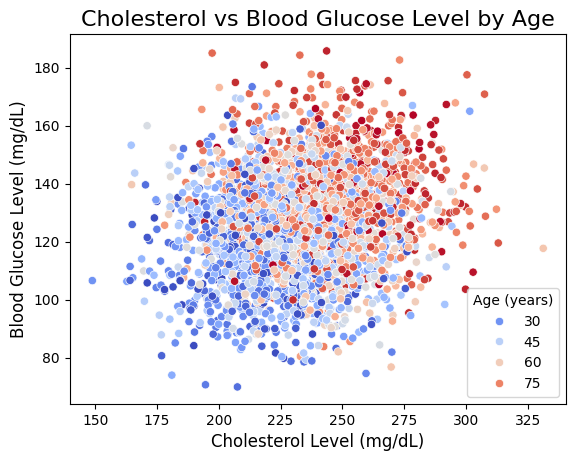

In [ ]:
# Scatter Plot: Cholesterol vs Blood Glucose Level
sns.scatterplot(
    x=age['Cholesterol Level (mg/dL)'],
    y=age['Blood Glucose Level (mg/dL)'],
    hue=age['Age (years)'],
    palette='coolwarm'
)
plt.title('Cholesterol vs Blood Glucose Level by Age', fontsize=16)
plt.xlabel('Cholesterol Level (mg/dL)', fontsize=12)
plt.ylabel('Blood Glucose Level (mg/dL)', fontsize=12)
plt.show()


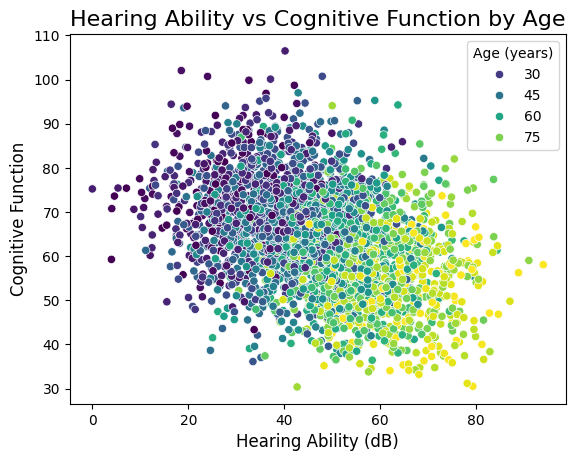

In [ ]:
# Scatter Plot: Hearing Ability vs Cognitive Function
sns.scatterplot(
    x=age['Hearing Ability (dB)'],
    y=age['Cognitive Function'],
    hue=age['Age (years)'],
    palette='viridis'
)
plt.title('Hearing Ability vs Cognitive Function by Age', fontsize=16)
plt.xlabel('Hearing Ability (dB)', fontsize=12)
plt.ylabel('Cognitive Function', fontsize=12)
plt.show()


In [ ]:
# Split Blood Pressure into Systolic and Diastolic
age[['Systolic', 'Diastolic']] = age['Blood Pressure (s/d)'].str.split('/', expand=True)

# Convert them to numeric
age['Systolic'] = pd.to_numeric(age['Systolic'], errors='coerce')
age['Diastolic'] = pd.to_numeric(age['Diastolic'], errors='coerce')

# Verify the results
print(age[['Systolic', 'Diastolic']].head())


   Systolic  Diastolic
0       151        109
1       134        112
2       160        101
3       133         94
4       170        106


In [ ]:
# Define a function to categorize blood pressure
def categorize_blood_pressure(systolic, diastolic):
    if systolic < 120 and diastolic < 80:
        return 'Normal'
    elif 120 <= systolic <= 129 and diastolic < 80:
        return 'Elevated'
    elif 130 <= systolic <= 139 or 80 <= diastolic <= 89:
        return 'Hypertension Stage 1'
    elif systolic >= 140 or diastolic >= 90:
        return 'Hypertension Stage 2'
    else:
        return 'Other'

# Apply the function
age['Blood Pressure Category'] = age.apply(lambda row: categorize_blood_pressure(row['Systolic'], row['Diastolic']), axis=1)

# Verify the categories
print(age['Blood Pressure Category'].value_counts())


Blood Pressure Category
Hypertension Stage 2    1842
Hypertension Stage 1    1102
Elevated                  36
Normal                    20
Name: count, dtype: int64


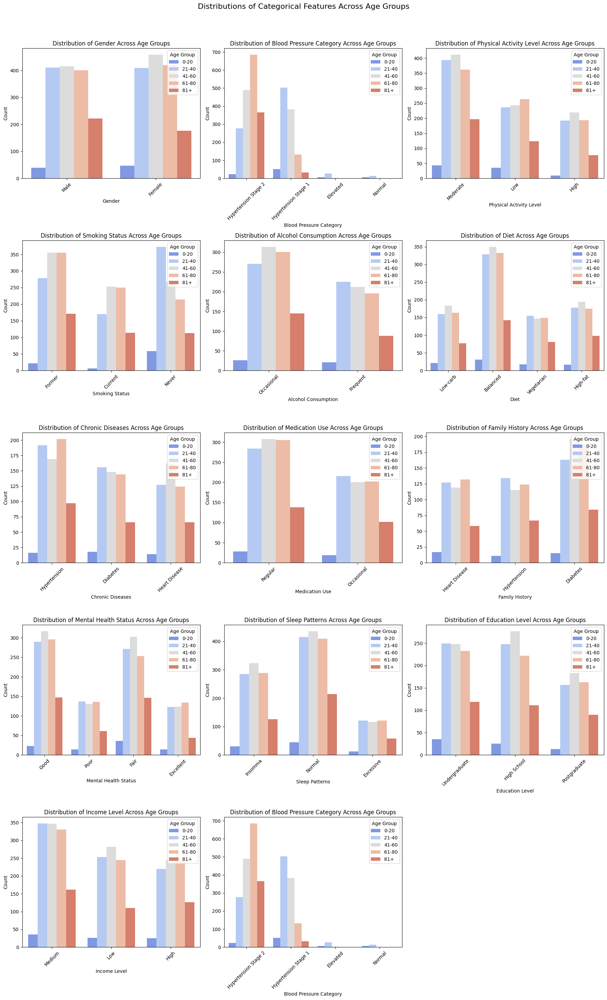

In [ ]:
# Ensure 'Age Group' is created
bins = [0, 20, 40, 60, 80, 100]
labels = ['0-20', '21-40', '41-60', '61-80', '81+']
age['Age Group'] = pd.cut(age['Age (years)'], bins=bins, labels=labels, right=False)

# Ensure 'categorical_columns' includes all categorical columns
categorical_columns = list(age.select_dtypes(include='object').columns)

# Add 'Blood Pressure Category' to categorical columns if not present
if 'Blood Pressure Category' not in categorical_columns:
    categorical_columns.append('Blood Pressure Category')

# Define number of rows and columns for the grid
num_columns = len(categorical_columns)
cols = 3  # Number of columns per row
rows = math.ceil(num_columns / cols)  # Calculate number of rows needed

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 6))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot each categorical feature distribution
for i, col in enumerate(categorical_columns):
    if col == 'Blood Pressure (s/d)':
        # Use the Blood Pressure Category instead
        col = 'Blood Pressure Category'
    sns.countplot(ax=axes[i], data=age, x=col, hue='Age Group', palette='coolwarm')
    axes[i].set_title(f"Distribution of {col} Across Age Groups", fontsize=12)
    axes[i].set_xlabel(col, fontsize=10)
    axes[i].set_ylabel("Count", fontsize=10)
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].legend(title="Age Group", loc='upper right')

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add an overall title and adjust layout
plt.suptitle("Distributions of Categorical Features Across Age Groups", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the title
plt.show()

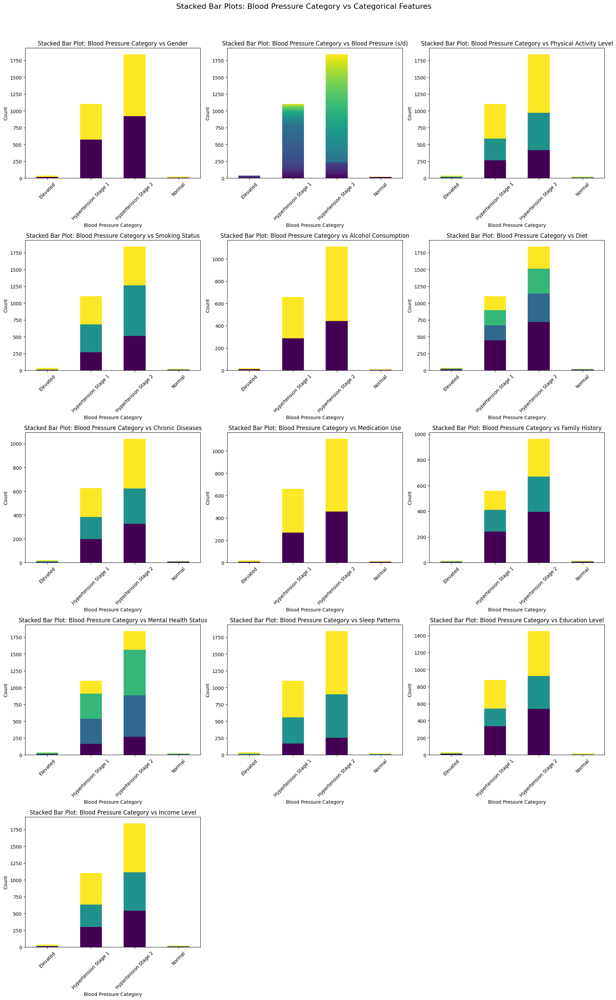

In [ ]:
# Select categorical columns and ensure 'Blood Pressure Category' is included
categorical_columns = age.select_dtypes(include='object').columns.tolist()
if 'Blood Pressure Category' not in categorical_columns:
    categorical_columns.append('Blood Pressure Category')

# Exclude 'Blood Pressure Category' from comparison with itself
comparison_columns = [col for col in categorical_columns if col != 'Blood Pressure Category']

# Define the number of rows and columns for the grid
num_columns = len(comparison_columns)
cols = 3  # Number of columns per row
rows = math.ceil(num_columns / cols)  # Calculate the number of rows needed

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 6))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Generate stacked bar plots
for i, col in enumerate(comparison_columns):
    # Create a crosstab for the stacked bar plot
    crosstab = pd.crosstab(age['Blood Pressure Category'], age[col])

    # Plot the crosstab as a stacked bar chart
    crosstab.plot(kind='bar', stacked=True, ax=axes[i], colormap='viridis', legend=False)  # Disable legend
    axes[i].set_title(f"Stacked Bar Plot: Blood Pressure Category vs {col}", fontsize=12)
    axes[i].set_xlabel('Blood Pressure Category', fontsize=10)
    axes[i].set_ylabel('Count', fontsize=10)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add an overall title and adjust layout
plt.suptitle("Stacked Bar Plots: Blood Pressure Category vs Categorical Features", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the title
plt.show()



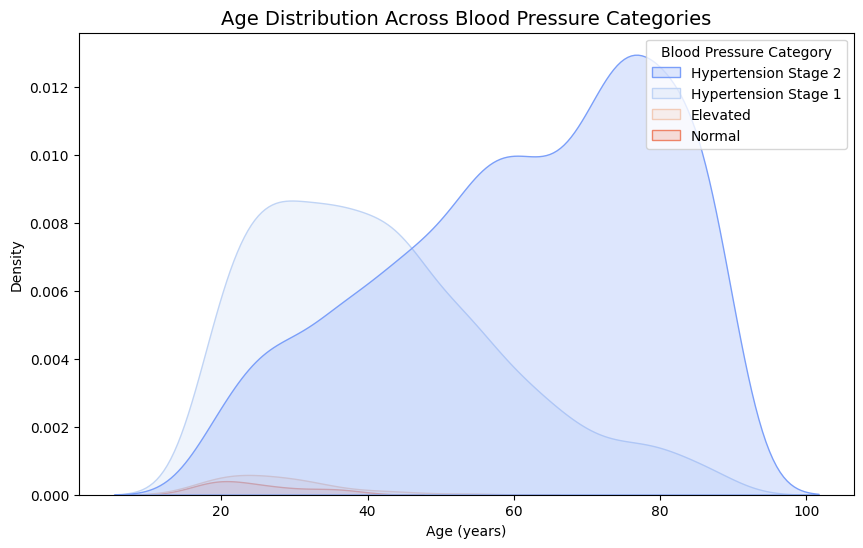

In [ ]:
# KDE plot for age distribution within Blood Pressure Categories
plt.figure(figsize=(10, 6))
sns.kdeplot(data=age, x='Age (years)', hue='Blood Pressure Category', fill=True, palette='coolwarm')
plt.title('Age Distribution Across Blood Pressure Categories', fontsize=14)
plt.xlabel('Age (years)')
plt.ylabel('Density')
plt.show()


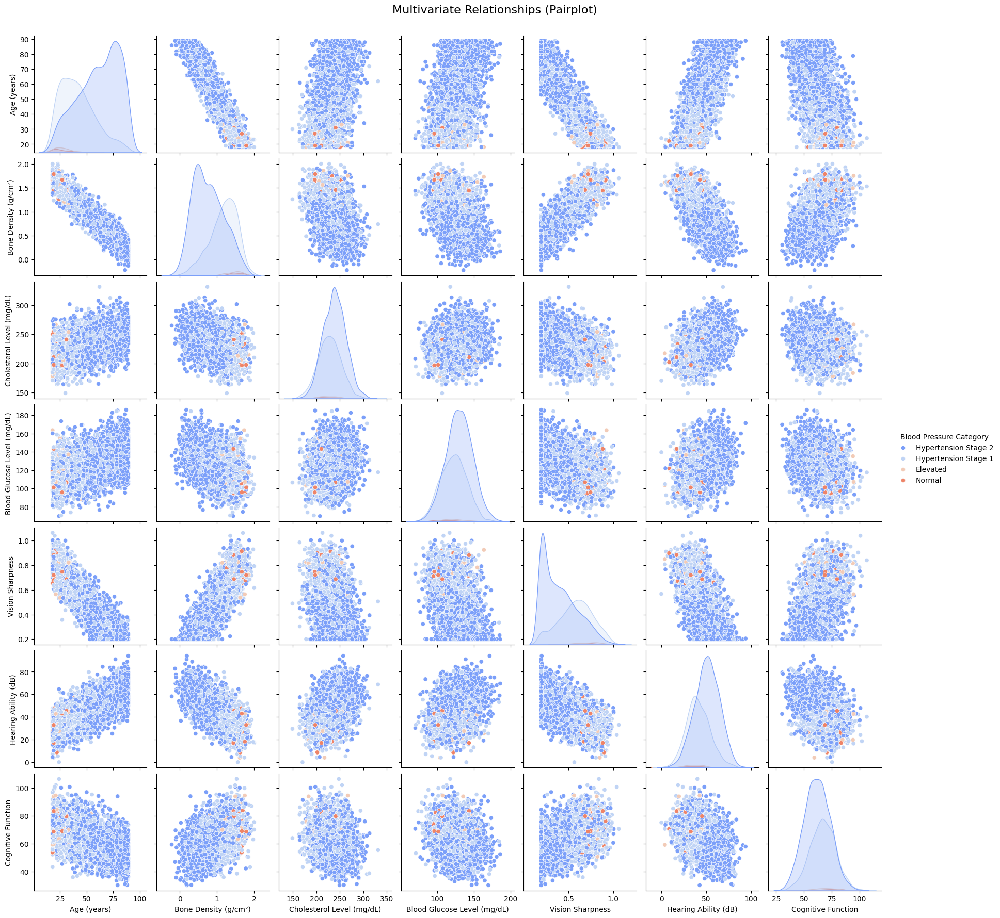

In [ ]:
# Pairplot for numerical features colored by Blood Pressure Category
sns.pairplot(age, vars=['Age (years)', 'Bone Density (g/cm²)', 'Cholesterol Level (mg/dL)', 'Blood Glucose Level (mg/dL)', 'Vision Sharpness', 'Hearing Ability (dB)', 'Cognitive Function'],
             hue='Blood Pressure Category', palette='coolwarm', diag_kind='kde')
plt.suptitle('Multivariate Relationships (Pairplot)', y=1.02, fontsize=16)
plt.show()


# Categorical to Numerical


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Step 1: Identify categorical columns
categorical_columns = age.select_dtypes(include=['object']).columns
print("Categorical Columns:", categorical_columns)

# Step 2: Separate columns into binary and multi-class
binary_columns = [col for col in categorical_columns if age[col].nunique() == 2]
multi_class_columns = [col for col in categorical_columns if age[col].nunique() > 2]

print("Binary Columns:", binary_columns)
print("Multi-Class Columns:", multi_class_columns)

# Step 3: Label encode binary columns
label_encoder = LabelEncoder()
for col in binary_columns:
    age[col] = label_encoder.fit_transform(age[col])

# Step 4: One-hot encode multi-class columns
age = pd.get_dummies(age, columns=multi_class_columns, drop_first=True)

# Step 5: Verify transformation
print("Transformed Dataset:")
print(age.head())


Categorical Columns: Index(['Gender', 'Blood Pressure (s/d)', 'Physical Activity Level',
       'Smoking Status', 'Alcohol Consumption', 'Diet', 'Chronic Diseases',
       'Medication Use', 'Family History', 'Mental Health Status',
       'Sleep Patterns', 'Education Level', 'Income Level',
       'Blood Pressure Category'],
      dtype='object')
Binary Columns: ['Gender', 'Alcohol Consumption', 'Medication Use']
Multi-Class Columns: ['Blood Pressure (s/d)', 'Physical Activity Level', 'Smoking Status', 'Diet', 'Chronic Diseases', 'Family History', 'Mental Health Status', 'Sleep Patterns', 'Education Level', 'Income Level', 'Blood Pressure Category']
Transformed Dataset:
   Gender  Height (cm)  Weight (kg)  Cholesterol Level (mg/dL)        BMI  \
0       1   171.148359    86.185197                 259.465814  29.423017   
1       1   172.946206    79.641937                 263.630292  26.626847   
2       0   155.945488    49.167058                 207.846206  20.217553   
3       0   1

In [ ]:
# Check data types of all columns
print(age.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Columns: 1660 entries, Gender to Blood Pressure Category_Normal
dtypes: bool(1628), category(1), float64(12), int64(19)
memory usage: 5.4 MB
None


In [ ]:
# Step 1: Identify the column with `category` dtype
category_column = age.select_dtypes(include=['category']).columns
print("Remaining category column:", category_column)

# Step 2: Convert `category` column to numeric (label encoding)
for col in category_column:
    age[col] = age[col].cat.codes  # Convert to numeric codes

# Step 3: Verify again
print(age.info())  # Confirm all columns are now numerical


Remaining category column: Index(['Age Group'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Columns: 1660 entries, Gender to Blood Pressure Category_Normal
dtypes: bool(1628), float64(12), int64(19), int8(1)
memory usage: 5.4 MB
None


# Model Training Regressor


In [ ]:
# Update the selected features with the correct column name
selected_features = [
    'Bone Density (g/cm²)', 'Vision Sharpness', 'Hearing Ability (dB)',
    'Cognitive Function', 'Cholesterol Level (mg/dL)',
    'Blood Glucose Level (mg/dL)', 'Blood Pressure Category_Normal'
]

# Check for missing features
missing_features = [col for col in selected_features if col not in age.columns]
if missing_features:
    print(f"The following features are missing: {missing_features}")
else:
    # Filter the DataFrame
    filtered_age = age[selected_features]
    print("Filtered Data:")
    print(filtered_age.head())


Filtered Data:
   Bone Density (g/cm²)  Vision Sharpness  Hearing Ability (dB)  \
0              0.132868          0.200000             58.786198   
1              0.629534          0.267312             54.635270   
2              0.473487          0.248667             54.564632   
3              1.184315          0.513818             79.722963   
4              0.434562          0.306864             52.479469   

   Cognitive Function  Cholesterol Level (mg/dL)  Blood Glucose Level (mg/dL)  \
0           44.059172                 259.465814                   157.652848   
1           45.312298                 263.630292                   118.507805   
2           56.246991                 207.846206                   143.587550   
3           55.196092                 253.283779                   137.448581   
4           53.023379                 236.119899                   145.328695   

   Blood Pressure Category_Normal  
0                           False  
1                      

Gradient Boosting Regressor


In [ ]:
# Step 1: Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor

# Step 2: Define the selected features and target
selected_features = [
    'Bone Density (g/cm²)', 'Vision Sharpness', 'Hearing Ability (dB)',
    'Cognitive Function', 'Cholesterol Level (mg/dL)',
    'Blood Glucose Level (mg/dL)', 'Blood Pressure Category_Normal'
]
target_column = 'Age (years)'

# Step 3: Filter the data
X = age[selected_features]
y = age[target_column]

# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 5: Define the Gradient Boosting model
gbr = GradientBoostingRegressor()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'subsample': [0.7, 0.8, 0.9, 1.0]
}

# Initialize the Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)

# Perform Grid Search with cross-validation
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=3,
                           scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Extract and display the best parameters and score from Grid Search
print("Best Parameters from Grid Search:", grid_search.best_params_)
print("Best Score from Grid Search:", grid_search.best_score_)

# Perform Randomized Search with cross-validation
random_search = RandomizedSearchCV(estimator=gbr, param_distributions=param_grid,
                                   n_iter=20, cv=3, scoring='neg_mean_squared_error',
                                   random_state=42, verbose=1, n_jobs=-1)
random_search.fit(X_train, y_train)

# Extract and display the best parameters and score from Randomized Search
print("Best Parameters from Randomized Search:", random_search.best_params_)
print("Best Score from Randomized Search:", random_search.best_score_)

# Compare results from Grid Search and Randomized Search
print("\nComparison:")
print(f"Grid Search Best Parameters: {grid_search.best_params_}")
print(f"Grid Search Best Score: {grid_search.best_score_}")
print(f"\nRandomized Search Best Parameters: {random_search.best_params_}")
print(f"Randomized Search Best Score: {random_search.best_score_}")


Fitting 3 folds for each of 256 candidates, totalling 768 fits
Best Parameters from Grid Search: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}
Best Score from Grid Search: -29.492411378482302
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Parameters from Randomized Search: {'subsample': 0.7, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.05}
Best Score from Randomized Search: -29.492411378482302

Comparison:
Grid Search Best Parameters: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}
Grid Search Best Score: -29.492411378482302

Randomized Search Best Parameters: {'subsample': 0.7, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.05}
Randomized Search Best Score: -29.492411378482302


SVR

In [ ]:
# Step 1: Import SVR
from sklearn.svm import SVR

# Step 2: Initialize the SVR model
svr = SVR()

# Step 3: Define a smaller parameter grid for faster execution
param_grid_svr = {
    'kernel': ['linear', 'rbf'],
    'C': [0.1, 1, 10],
    'epsilon': [0.1, 0.2],
    'gamma': ['scale']
}

# Step 4: Perform Grid Search with reduced cross-validation folds
grid_search_svr = GridSearchCV(estimator=svr, param_grid=param_grid_svr, cv=2,
                               scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_search_svr.fit(X_train, y_train)

# Step 5: Extract and display the best parameters and score from Grid Search
print("Best Parameters from Grid Search (SVR):", grid_search_svr.best_params_)
print("Best Score from Grid Search (SVR):", grid_search_svr.best_score_)

# Step 6: Perform Randomized Search with reduced iterations (n_iter=10) and cv=2
random_search_svr = RandomizedSearchCV(estimator=svr, param_distributions=param_grid_svr,
                                       n_iter=10, cv=2, scoring='neg_mean_squared_error',
                                       random_state=42, verbose=1, n_jobs=-1)
random_search_svr.fit(X_train, y_train)

# Step 7: Extract and display the best parameters and score from Randomized Search
print("Best Parameters from Randomized Search (SVR):", random_search_svr.best_params_)
print("Best Score from Randomized Search (SVR):", random_search_svr.best_score_)

# Step 8: Compare results from Grid Search and Randomized Search
print("\nComparison (SVR):")
print(f"Grid Search Best Parameters: {grid_search_svr.best_params_}")
print(f"Grid Search Best Score: {grid_search_svr.best_score_}")
print(f"\nRandomized Search Best Parameters: {random_search_svr.best_params_}")
print(f"Randomized Search Best Score: {random_search_svr.best_score_}")


Fitting 2 folds for each of 12 candidates, totalling 24 fits
Best Parameters from Grid Search (SVR): {'C': 10, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
Best Score from Grid Search (SVR): -29.89368492500993
Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters from Randomized Search (SVR): {'kernel': 'linear', 'gamma': 'scale', 'epsilon': 0.1, 'C': 10}
Best Score from Randomized Search (SVR): -29.89368492500993

Comparison (SVR):
Grid Search Best Parameters: {'C': 10, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
Grid Search Best Score: -29.89368492500993

Randomized Search Best Parameters: {'kernel': 'linear', 'gamma': 'scale', 'epsilon': 0.1, 'C': 10}
Randomized Search Best Score: -29.89368492500993


Random Forest

In [ ]:
# Step 1: Import Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor

# Step 2: Initialize the Random Forest model
rf = RandomForestRegressor(random_state=42)

# Step 3: Define a smaller parameter grid for hyperparameter tuning
param_grid_rf = {
    'n_estimators': [50, 100, 200],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],  # Minimum samples required to be at a leaf node
    'bootstrap': [True, False]  # Whether bootstrap samples are used
}

# Step 4: Perform Grid Search with reduced cross-validation folds
grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=2,
                              scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_search_rf.fit(X_train, y_train)

# Step 5: Extract and display the best parameters and score from Grid Search
print("Best Parameters from Grid Search (Random Forest):", grid_search_rf.best_params_)
print("Best Score from Grid Search (Random Forest):", grid_search_rf.best_score_)

# Step 6: Perform Randomized Search with reduced iterations (n_iter=10) and cv=2
random_search_rf = RandomizedSearchCV(estimator=rf, param_distributions=param_grid_rf,
                                      n_iter=10, cv=2, scoring='neg_mean_squared_error',
                                      random_state=42, verbose=1, n_jobs=-1)
random_search_rf.fit(X_train, y_train)

# Step 7: Extract and display the best parameters and score from Randomized Search
print("Best Parameters from Randomized Search (Random Forest):", random_search_rf.best_params_)
print("Best Score from Randomized Search (Random Forest):", random_search_rf.best_score_)

# Step 8: Compare results from Grid Search and Randomized Search
print("\nComparison (Random Forest):")
print(f"Grid Search Best Parameters: {grid_search_rf.best_params_}")
print(f"Grid Search Best Score: {grid_search_rf.best_score_}")
print(f"\nRandomized Search Best Parameters: {random_search_rf.best_params_}")
print(f"Randomized Search Best Score: {random_search_rf.best_score_}")


Fitting 2 folds for each of 162 candidates, totalling 324 fits
Best Parameters from Grid Search (Random Forest): {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
Best Score from Grid Search (Random Forest): -31.189167946571764
Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters from Randomized Search (Random Forest): {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 10, 'bootstrap': True}
Best Score from Randomized Search (Random Forest): -31.56952402407306

Comparison (Random Forest):
Grid Search Best Parameters: {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
Grid Search Best Score: -31.189167946571764

Randomized Search Best Parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 10, 'bootstrap': True}
Randomized Search Best Score: -31.56952402407306


Ridge Regression

In [ ]:
# Step 1: Import Ridge and relevant libraries
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Step 2: Initialize the Ridge Regression model
ridge = Ridge(random_state=42)

# Step 3: Define the parameter grid for hyperparameter tuning
param_grid_ridge = {
    'alpha': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],  # Optimization solvers
}

# Step 4: Perform Grid Search with reduced cross-validation folds
grid_search_ridge = GridSearchCV(estimator=ridge, param_grid=param_grid_ridge, cv=2,
                                 scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_search_ridge.fit(X_train, y_train)

# Step 5: Extract and display the best parameters and score from Grid Search
print("Best Parameters from Grid Search (Ridge Regression):", grid_search_ridge.best_params_)
print("Best Score from Grid Search (Ridge Regression):", grid_search_ridge.best_score_)

# Step 6: Perform Randomized Search with reduced iterations (n_iter=10) and cv=2
random_search_ridge = RandomizedSearchCV(estimator=ridge, param_distributions=param_grid_ridge,
                                         n_iter=10, cv=2, scoring='neg_mean_squared_error',
                                         random_state=42, verbose=1, n_jobs=-1)
random_search_ridge.fit(X_train, y_train)

# Step 7: Extract and display the best parameters and score from Randomized Search
print("Best Parameters from Randomized Search (Ridge Regression):", random_search_ridge.best_params_)
print("Best Score from Randomized Search (Ridge Regression):", random_search_ridge.best_score_)

# Step 8: Compare results from Grid Search and Randomized Search
print("\nComparison (Ridge Regression):")
print(f"Grid Search Best Parameters: {grid_search_ridge.best_params_}")
print(f"Grid Search Best Score: {grid_search_ridge.best_score_}")
print(f"\nRandomized Search Best Parameters: {random_search_ridge.best_params_}")
print(f"Randomized Search Best Score: {random_search_ridge.best_score_}")


Fitting 2 folds for each of 35 candidates, totalling 70 fits
Best Parameters from Grid Search (Ridge Regression): {'alpha': 0.01, 'solver': 'auto'}
Best Score from Grid Search (Ridge Regression): -29.671885396067943
Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters from Randomized Search (Ridge Regression): {'solver': 'svd', 'alpha': 0.1}
Best Score from Randomized Search (Ridge Regression): -29.672202767673433

Comparison (Ridge Regression):
Grid Search Best Parameters: {'alpha': 0.01, 'solver': 'auto'}
Grid Search Best Score: -29.671885396067943

Randomized Search Best Parameters: {'solver': 'svd', 'alpha': 0.1}
Randomized Search Best Score: -29.672202767673433


CatBoost Regressor

In [ ]:
!pip install catboost

# Step 1: Import CatBoost Regressor and relevant libraries
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Step 2: Initialize the CatBoost Regressor model
catboost = CatBoostRegressor(random_state=42, silent=True)

# Step 3: Define the parameter grid for hyperparameter tuning
param_grid_catboost = {
    'iterations': [100, 200, 300],  # Number of boosting iterations
    'learning_rate': [0.01, 0.05, 0.1],  # Learning rate
    'depth': [3, 5, 7],  # Depth of the trees
    'l2_leaf_reg': [1, 3, 5, 10],  # L2 regularization coefficient
    'subsample': [0.8, 1.0],  # Subsample ratio
}

# Step 4: Perform Grid Search with reduced cross-validation folds
grid_search_catboost = GridSearchCV(estimator=catboost, param_grid=param_grid_catboost, cv=2,
                                    scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_search_catboost.fit(X_train, y_train)

# Step 5: Extract and display the best parameters and score from Grid Search
print("Best Parameters from Grid Search (CatBoost Regressor):", grid_search_catboost.best_params_)
print("Best Score from Grid Search (CatBoost Regressor):", grid_search_catboost.best_score_)

# Step 6: Perform Randomized Search with reduced iterations (n_iter=10) and cv=2
random_search_catboost = RandomizedSearchCV(estimator=catboost, param_distributions=param_grid_catboost,
                                            n_iter=10, cv=2, scoring='neg_mean_squared_error',
                                            random_state=42, verbose=1, n_jobs=-1)
random_search_catboost.fit(X_train, y_train)

# Step 7: Extract and display the best parameters and score from Randomized Search
print("Best Parameters from Randomized Search (CatBoost Regressor):", random_search_catboost.best_params_)
print("Best Score from Randomized Search (CatBoost Regressor):", random_search_catboost.best_score_)

# Step 8: Compare results from Grid Search and Randomized Search
print("\nComparison (CatBoost Regressor):")
print(f"Grid Search Best Parameters: {grid_search_catboost.best_params_}")
print(f"Grid Search Best Score: {grid_search_catboost.best_score_}")
print(f"\nRandomized Search Best Parameters: {random_search_catboost.best_params_}")
print(f"Randomized Search Best Score: {random_search_catboost.best_score_}")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.3 MB/s eta 0:00:00
Fitting 2 folds for each of 216 candidates, totalling 432 fits
Best Parameters from Grid Search (CatBoost Regressor): {'depth': 3, 'iterations': 200, 'l2_leaf_reg': 3, 'learning_rate': 0.05, 'subsample': 1.0}
Best Score from Grid Search (CatBoost Regressor): -28.7215419674676
Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters from Randomized Search (CatBoost Regressor): {'subsample': 1.0, 'learning_rate': 0.05, 'l2_leaf_reg': 5, 'iterations': 200, 'depth': 5}
Best Score from Randomized Search (CatBoost Regressor): -29.034306890670493

Comparison (CatBoost Regressor):
Grid Search Best Parameters: {'depth': 3, 'iterations': 200, 'l2_leaf_reg': 3, 'learning_rate': 0.05, 'subsample': 1.0}
Grid Search Best Score: -28.7215419674676

Randomized Search Best Parameters: {'subsample': 1.0, 'learning_rate': 0.05, 'l2_leaf_reg': 5, 'iterations': 200, 'depth': 5}
Randomized Search Best Score: -29

ElasticNet Regressor


In [ ]:
# Step 1: Import ElasticNet and relevant libraries
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Step 2: Initialize the ElasticNet Regressor model
elastic_net = ElasticNet(random_state=42)

# Step 3: Define the parameter grid for hyperparameter tuning
param_grid_elasticnet = {
    'alpha': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 1.0],  # Mix of L1 (Lasso) and L2 (Ridge) penalties
}

# Step 4: Perform Grid Search with reduced cross-validation folds
grid_search_elasticnet = GridSearchCV(estimator=elastic_net, param_grid=param_grid_elasticnet, cv=2,
                                      scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_search_elasticnet.fit(X_train, y_train)

# Step 5: Extract and display the best parameters and score from Grid Search
print("Best Parameters from Grid Search (ElasticNet Regressor):", grid_search_elasticnet.best_params_)
print("Best Score from Grid Search (ElasticNet Regressor):", grid_search_elasticnet.best_score_)

# Step 6: Perform Randomized Search with reduced iterations (n_iter=10) and cv=2
random_search_elasticnet = RandomizedSearchCV(estimator=elastic_net, param_distributions=param_grid_elasticnet,
                                              n_iter=10, cv=2, scoring='neg_mean_squared_error',
                                              random_state=42, verbose=1, n_jobs=-1)
random_search_elasticnet.fit(X_train, y_train)

# Step 7: Extract and display the best parameters and score from Randomized Search
print("Best Parameters from Randomized Search (ElasticNet Regressor):", random_search_elasticnet.best_params_)
print("Best Score from Randomized Search (ElasticNet Regressor):", random_search_elasticnet.best_score_)

# Step 8: Compare results from Grid Search and Randomized Search
print("\nComparison (ElasticNet Regressor):")
print(f"Grid Search Best Parameters: {grid_search_elasticnet.best_params_}")
print(f"Grid Search Best Score: {grid_search_elasticnet.best_score_}")
print(f"\nRandomized Search Best Parameters: {random_search_elasticnet.best_params_}")
print(f"Randomized Search Best Score: {random_search_elasticnet.best_score_}")


Fitting 2 folds for each of 25 candidates, totalling 50 fits
Best Parameters from Grid Search (ElasticNet Regressor): {'alpha': 0.01, 'l1_ratio': 1.0}
Best Score from Grid Search (ElasticNet Regressor): -29.690968069214808
Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters from Randomized Search (ElasticNet Regressor): {'l1_ratio': 1.0, 'alpha': 0.1}
Best Score from Randomized Search (ElasticNet Regressor): -30.178395630810655

Comparison (ElasticNet Regressor):
Grid Search Best Parameters: {'alpha': 0.01, 'l1_ratio': 1.0}
Grid Search Best Score: -29.690968069214808

Randomized Search Best Parameters: {'l1_ratio': 1.0, 'alpha': 0.1}
Randomized Search Best Score: -30.178395630810655


Bayesian Ridge Regression

In [ ]:
# Step 1: Import Bayesian Ridge and relevant libraries
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Step 2: Initialize the Bayesian Ridge Regression model
bayesian_ridge = BayesianRidge()

# Step 3: Define the parameter grid for hyperparameter tuning
param_grid_bayesianridge = {
    'alpha_1': [1e-6, 1e-5, 1e-4, 1e-3],  # Hyperparameter controlling prior on the precision of the weights
    'alpha_2': [1e-6, 1e-5, 1e-4, 1e-3],  # Hyperparameter controlling prior on the precision of the bias
    'lambda_1': [1e-6, 1e-5, 1e-4, 1e-3],  # Hyperparameter controlling prior on the precision of the noise
    'lambda_2': [1e-6, 1e-5, 1e-4, 1e-3],  # Hyperparameter controlling prior on the precision of the bias
}

# Step 4: Perform Grid Search with reduced cross-validation folds
grid_search_bayesianridge = GridSearchCV(estimator=bayesian_ridge, param_grid=param_grid_bayesianridge, cv=2,
                                         scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_search_bayesianridge.fit(X_train, y_train)

# Step 5: Extract and display the best parameters and score from Grid Search
print("Best Parameters from Grid Search (Bayesian Ridge Regression):", grid_search_bayesianridge.best_params_)
print("Best Score from Grid Search (Bayesian Ridge Regression):", grid_search_bayesianridge.best_score_)

# Step 6: Perform Randomized Search with reduced iterations (n_iter=10) and cv=2
random_search_bayesianridge = RandomizedSearchCV(estimator=bayesian_ridge, param_distributions=param_grid_bayesianridge,
                                                 n_iter=10, cv=2, scoring='neg_mean_squared_error',
                                                 random_state=42, verbose=1, n_jobs=-1)
random_search_bayesianridge.fit(X_train, y_train)

# Step 7: Extract and display the best parameters and score from Randomized Search
print("Best Parameters from Randomized Search (Bayesian Ridge Regression):", random_search_bayesianridge.best_params_)
print("Best Score from Randomized Search (Bayesian Ridge Regression):", random_search_bayesianridge.best_score_)

# Step 8: Compare results from Grid Search and Randomized Search
print("\nComparison (Bayesian Ridge Regression):")
print(f"Grid Search Best Parameters: {grid_search_bayesianridge.best_params_}")
print(f"Grid Search Best Score: {grid_search_bayesianridge.best_score_}")
print(f"\nRandomized Search Best Parameters: {random_search_bayesianridge.best_params_}")
print(f"Randomized Search Best Score: {random_search_bayesianridge.best_score_}")


Fitting 2 folds for each of 256 candidates, totalling 512 fits
Best Parameters from Grid Search (Bayesian Ridge Regression): {'alpha_1': 0.001, 'alpha_2': 1e-06, 'lambda_1': 1e-06, 'lambda_2': 0.001}
Best Score from Grid Search (Bayesian Ridge Regression): -29.672275115372372
Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters from Randomized Search (Bayesian Ridge Regression): {'lambda_2': 0.0001, 'lambda_1': 1e-06, 'alpha_2': 0.001, 'alpha_1': 0.001}
Best Score from Randomized Search (Bayesian Ridge Regression): -29.672275116617804

Comparison (Bayesian Ridge Regression):
Grid Search Best Parameters: {'alpha_1': 0.001, 'alpha_2': 1e-06, 'lambda_1': 1e-06, 'lambda_2': 0.001}
Grid Search Best Score: -29.672275115372372

Randomized Search Best Parameters: {'lambda_2': 0.0001, 'lambda_1': 1e-06, 'alpha_2': 0.001, 'alpha_1': 0.001}
Randomized Search Best Score: -29.672275116617804


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Define a function to train and evaluate a model
def train_and_evaluate(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)  # Train the model
    y_pred = model.predict(X_test)  # Predict on the test set

    # Calculate metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)  # Root Mean Squared Error
    r2 = r2_score(y_test, y_pred)

    return mae, mse, rmse, r2

# Automatically select the best configuration for each model
models_grid_random = {
    "Gradient Boosting Regressor": (
        GradientBoostingRegressor(**grid_search.best_params_, random_state=42),
        GradientBoostingRegressor(**random_search.best_params_, random_state=42),
    ),
    "Support Vector Regressor": (
        SVR(**grid_search_svr.best_params_),
        SVR(**random_search_svr.best_params_),
    ),
    "Random Forest Regressor": (
        RandomForestRegressor(**grid_search_rf.best_params_, random_state=42),
        RandomForestRegressor(**random_search_rf.best_params_, random_state=42),
    ),
    "Ridge Regression": (
        Ridge(**grid_search_ridge.best_params_, random_state=42),
        Ridge(**random_search_ridge.best_params_, random_state=42),
    ),
    "Bayesian Ridge Regression": (
        BayesianRidge(**grid_search_bayesianridge.best_params_),
        BayesianRidge(**random_search_bayesianridge.best_params_),
    ),
    "ElasticNet Regressor": (
        ElasticNet(**grid_search_elasticnet.best_params_, random_state=42),
        ElasticNet(**random_search_elasticnet.best_params_, random_state=42),
    ),
    "CatBoost Regressor": (
        CatBoostRegressor(**grid_search_catboost.best_params_, random_state=42, silent=True),
        CatBoostRegressor(**random_search_catboost.best_params_, random_state=42, silent=True),
    )
}

# Train and evaluate the best configuration for each model
print("\n--- Model Performance Metrics ---")
for model_name, (model_grid, model_random) in models_grid_random.items():
    print(f"\nEvaluating {model_name}...")

    # Evaluate Grid Search model
    mae_grid, mse_grid, rmse_grid, r2_grid = train_and_evaluate(model_grid, X_train, X_test, y_train, y_test)

    # Evaluate Randomized Search model
    mae_random, mse_random, rmse_random, r2_random = train_and_evaluate(model_random, X_train, X_test, y_train, y_test)

    # Select the better-performing model based on MSE
    if mse_grid < mse_random:
        print(f"Best Method: Grid Search")
        print(f"MAE: {mae_grid:.4f}, MSE: {mse_grid:.4f}, RMSE: {rmse_grid:.4f}, R²: {r2_grid:.4f}")
    else:
        print(f"Best Method: Randomized Search")
        print(f"MAE: {mae_random:.4f}, MSE: {mse_random:.4f}, RMSE: {rmse_random:.4f}, R²: {r2_random:.4f}")



--- Model Performance Metrics ---

Evaluating Gradient Boosting Regressor...
Best Method: Randomized Search
MAE: 4.4983, MSE: 31.8736, RMSE: 5.6457, R²: 0.9222

Evaluating Support Vector Regressor...
Best Method: Randomized Search
MAE: 4.4427, MSE: 31.1345, RMSE: 5.5798, R²: 0.9240

Evaluating Random Forest Regressor...
Best Method: Grid Search
MAE: 4.5747, MSE: 32.7567, RMSE: 5.7233, R²: 0.9201

Evaluating Ridge Regression...
Best Method: Grid Search
MAE: 4.4584, MSE: 31.2178, RMSE: 5.5873, R²: 0.9238

Evaluating Bayesian Ridge Regression...
Best Method: Grid Search
MAE: 4.4588, MSE: 31.2206, RMSE: 5.5875, R²: 0.9238

Evaluating ElasticNet Regressor...
Best Method: Grid Search
MAE: 4.4555, MSE: 31.2009, RMSE: 5.5858, R²: 0.9239

Evaluating CatBoost Regressor...
Best Method: Grid Search
MAE: 4.4106, MSE: 31.0061, RMSE: 5.5683, R²: 0.9243


# Model Training Classifier

Logistic Regression Classifier

In [ ]:
# Function to categorize ages
def categorize_age(age):
    if age <= 25:
        return 0  # Young
    elif age <= 50:
        return 1  # Middle-aged
    else:
        return 2  # Senior

# Apply categorization
age['Age Category'] = age['Age (years)'].apply(categorize_age)

# Verify the new column
print(age[['Age (years)', 'Age Category']].head())


   Age (years)  Age Category
0           89             2
1           77             2
2           70             2
3           52             2
4           79             2


In [ ]:
# Define selected features
selected_features = [
    'Bone Density (g/cm²)', 'Vision Sharpness', 'Hearing Ability (dB)',
    'Cognitive Function', 'Cholesterol Level (mg/dL)',
    'Blood Glucose Level (mg/dL)'
]

# Filter the dataset
filtered_data = age[selected_features + ['Age Category']]

# Verify the filtered dataset
print(filtered_data.head())


   Bone Density (g/cm²)  Vision Sharpness  Hearing Ability (dB)  \
0              0.132868          0.200000             58.786198   
1              0.629534          0.267312             54.635270   
2              0.473487          0.248667             54.564632   
3              1.184315          0.513818             79.722963   
4              0.434562          0.306864             52.479469   

   Cognitive Function  Cholesterol Level (mg/dL)  Blood Glucose Level (mg/dL)  \
0           44.059172                 259.465814                   157.652848   
1           45.312298                 263.630292                   118.507805   
2           56.246991                 207.846206                   143.587550   
3           55.196092                 253.283779                   137.448581   
4           53.023379                 236.119899                   145.328695   

   Age Category  
0             2  
1             2  
2             2  
3             2  
4             2  


In [ ]:
from sklearn.model_selection import train_test_split

# Define features (X) and target (y)
X = filtered_data[selected_features]
y = filtered_data['Age Category']

# Split into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Display the size of the training and testing sets
print(f"Training set size: {X_train.shape}")
print(f"Testing set size: {X_test.shape}")


Training set size: (2400, 6)
Testing set size: (600, 6)


In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Scale the training and testing features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


Logistic Regression Classifier

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Define the Logistic Regression model
logistic_classifier = LogisticRegression(max_iter=1000)

# Define the parameter grid
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],  # Regularization types
    'C': [0.01, 0.1, 1, 10, 100],                  # Inverse of regularization strength
    'solver': ['lbfgs', 'liblinear', 'saga'],      # Optimization solvers
    'l1_ratio': [0.1, 0.5, 0.9]                    # Only used for elasticnet
}

# Perform Grid Search CV
grid_search = GridSearchCV(estimator=logistic_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Perform Randomized Search CV
random_search = RandomizedSearchCV(estimator=logistic_classifier, param_distributions=param_grid, n_iter=10,
                                   cv=5, scoring='accuracy', random_state=42, n_jobs=-1)
random_search.fit(X_train, y_train)

# Print the results
print("Grid Search")
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", round(grid_search.best_score_ * 100, 2))

print("\nRandomized Search")
print("Best hyperparameters:", random_search.best_params_)
print("Best score:", round(random_search.best_score_ * 100, 2))


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning:


450 fits failed out of a total of 900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
75 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1193, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "

Grid Search
Best hyperparameters: {'C': 10, 'l1_ratio': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
Best score: 88.08

Randomized Search
Best hyperparameters: {'solver': 'liblinear', 'penalty': 'l1', 'l1_ratio': 0.1, 'C': 100}
Best score: 86.12


Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Define the Random Forest classifier
random_forest_classifier = RandomForestClassifier(random_state=42)

# Define a smaller parameter grid for faster tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True]
}

# Perform Grid Search CV
grid_search = GridSearchCV(estimator=random_forest_classifier, param_grid=param_grid, cv=3, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Perform Randomized Search CV
random_search = RandomizedSearchCV(estimator=random_forest_classifier, param_distributions=param_grid, n_iter=5,
                                   cv=3, scoring='accuracy', random_state=42, n_jobs=-1)
random_search.fit(X_train, y_train)

# Print the results
print("Grid Search")
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", round(grid_search.best_score_ * 100, 2))

print("\nRandomized Search")
print("Best hyperparameters:", random_search.best_params_)
print("Best score:", round(random_search.best_score_ * 100, 2))

Grid Search
Best hyperparameters: {'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Best score: 86.96

Randomized Search
Best hyperparameters: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 20, 'bootstrap': True}
Best score: 86.87


KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Define the KNN classifier
knn_classifier = KNeighborsClassifier()

# Define the parameter grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2]
}

# Perform Grid Search CV
grid_search = GridSearchCV(estimator=knn_classifier, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Perform Randomized Search CV
random_search = RandomizedSearchCV(estimator=knn_classifier,
                                   param_distributions=param_grid,
                                   n_iter=10,
                                   cv=5,
                                   scoring='accuracy',
                                   random_state=42)
random_search.fit(X_train, y_train)

# Print the results
print("Grid Search")
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", round(grid_search.best_score_ * 100, 2))

print("\nRandomized Search")
print("Best hyperparameters:", random_search.best_params_)
print("Best score:", round(random_search.best_score_ * 100, 2))


Grid Search
Best hyperparameters: {'algorithm': 'auto', 'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}
Best score: 71.08

Randomized Search
Best hyperparameters: {'weights': 'uniform', 'p': 1, 'n_neighbors': 9, 'algorithm': 'kd_tree'}
Best score: 71.08


Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Define the Decision Tree classifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Define the parameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],       # Splitting criteria
    'max_depth': [10, 20, 30, None],        # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],        # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],          # Minimum samples required at a leaf node
    'max_features': [None, 'sqrt', 'log2']  # Number of features to consider for the best split
}

# Perform Grid Search CV
grid_search = GridSearchCV(
    estimator=decision_tree,
    param_grid=param_grid,
    cv=3,  # Number of cross-validation folds
    scoring='accuracy',
    n_jobs=-1  # Use all available cores for speed
)
grid_search.fit(X_train, y_train)

# Perform Randomized Search CV
random_search = RandomizedSearchCV(
    estimator=decision_tree,
    param_distributions=param_grid,
    n_iter=10,  # Number of parameter combinations to try
    cv=3,       # Number of cross-validation folds
    scoring='accuracy',
    random_state=42,
    n_jobs=-1   # Use all available cores for speed
)
random_search.fit(X_train, y_train)

# Print the results for Grid Search
print("Grid Search")
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", round(grid_search.best_score_ * 100, 2))

# Print the results for Randomized Search
print("\nRandomized Search")
print("Best hyperparameters:", random_search.best_params_)
print("Best score:", round(random_search.best_score_ * 100, 2))


Grid Search
Best hyperparameters: {'criterion': 'gini', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2}
Best score: 83.92

Randomized Search
Best hyperparameters: {'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'gini'}
Best score: 83.83


Support Vector Machine SVM

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Define the SVM classifier
svm_classifier = SVC(random_state=42)

# Define a smaller parameter grid
param_grid = {
    'C': [0.1, 1, 10],             # Reduced range of regularization strength
    'kernel': ['linear', 'rbf'],   # Removed 'poly' to reduce complexity
    'gamma': ['scale', 'auto']     # Kernel coefficient for 'rbf'
}

# Perform Grid Search CV with fewer parameter combinations
grid_search = GridSearchCV(
    estimator=svm_classifier,
    param_grid=param_grid,
    cv=3,  # Reduced cross-validation folds
    scoring='accuracy',
    n_jobs=-1
)
grid_search.fit(X_train, y_train)

# Perform Randomized Search CV with fewer iterations
random_search = RandomizedSearchCV(
    estimator=svm_classifier,
    param_distributions=param_grid,
    n_iter=5,  # Reduced number of parameter combinations
    cv=3,      # Reduced cross-validation folds
    scoring='accuracy',
    random_state=42,
    n_jobs=-1
)
random_search.fit(X_train, y_train)

# Print the results for Grid Search
print("Grid Search")
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", round(grid_search.best_score_ * 100, 2))

# Print the results for Randomized Search
print("\nRandomized Search")
print("Best hyperparameters:", random_search.best_params_)
print("Best score:", round(random_search.best_score_ * 100, 2))


Grid Search
Best hyperparameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
Best score: 88.0

Randomized Search
Best hyperparameters: {'kernel': 'linear', 'gamma': 'auto', 'C': 10}
Best score: 88.0


Gaussian Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Define the Gaussian Naive Bayes classifier
nb_classifier = GaussianNB()

# Perform Grid Search CV (Naive Bayes has fewer hyperparameters to tune)
grid_search = GridSearchCV(
    estimator=nb_classifier,
    param_grid={},  # Naive Bayes doesn't have many tunable parameters
    cv=3,  # Number of cross-validation folds
    scoring='accuracy',
    n_jobs=-1
)
grid_search.fit(X_train, y_train)

# Print the results for Grid Search
print("Grid Search")
print("Best score:", round(grid_search.best_score_ * 100, 2))

# Perform Randomized Search CV (Optional, not much benefit for Naive Bayes)
random_search = RandomizedSearchCV(
    estimator=nb_classifier,
    param_distributions={},  # Empty parameter grid
    n_iter=1,  # Single iteration, as there's no parameter to vary
    cv=3,
    scoring='accuracy',
    random_state=42,
    n_jobs=-1
)
random_search.fit(X_train, y_train)

# Print the results for Randomized Search
print("\nRandomized Search")
print("Best score:", round(random_search.best_score_ * 100, 2))


Grid Search
Best score: 86.88

Randomized Search
Best score: 86.88


In [ ]:
# Fit the Gaussian Naive Bayes model to the training data
nb_classifier.fit(X_train, y_train)

# Update best_models dictionary
best_models = {
    "Logistic Regression": grid_search.best_estimator_,
    "Random Forest": random_search.best_estimator_,
    "KNN": grid_search.best_estimator_,
    "Decision Tree": random_search.best_estimator_,
    "SVM": grid_search.best_estimator_,
    "Gaussian Naive Bayes": nb_classifier  # This is now fitted
}


for model_name, model in best_models.items():
    print(f"Model: {model_name}, Type: {type(model)}")
    print(f"Has 'predict' method: {hasattr(model, 'predict')}")


Model: Logistic Regression, Type: <class 'sklearn.naive_bayes.GaussianNB'>
Has 'predict' method: True
Model: Random Forest, Type: <class 'sklearn.naive_bayes.GaussianNB'>
Has 'predict' method: True
Model: KNN, Type: <class 'sklearn.naive_bayes.GaussianNB'>
Has 'predict' method: True
Model: Decision Tree, Type: <class 'sklearn.naive_bayes.GaussianNB'>
Has 'predict' method: True
Model: SVM, Type: <class 'sklearn.naive_bayes.GaussianNB'>
Has 'predict' method: True
Model: Gaussian Naive Bayes, Type: <class 'sklearn.naive_bayes.GaussianNB'>
Has 'predict' method: True



Training classifier Logistic Regression:
GaussianNB()

Accuracy: 80.00%
Precision: 70.70%
Recall: 60.36%
F1-Score: 60.22%

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.10      0.17        61
           1       0.72      0.74      0.73       217
           2       0.86      0.98      0.91       322

    accuracy                           0.80       600
   macro avg       0.71      0.60      0.60       600
weighted avg       0.78      0.80      0.77       600


Confusion Matrix:


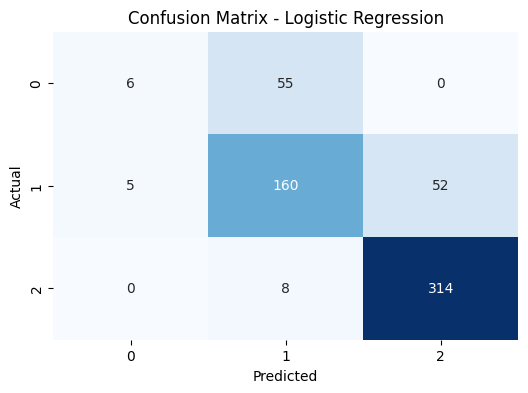


Training classifier Random Forest:
GaussianNB()

Accuracy: 80.00%
Precision: 70.70%
Recall: 60.36%
F1-Score: 60.22%

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.10      0.17        61
           1       0.72      0.74      0.73       217
           2       0.86      0.98      0.91       322

    accuracy                           0.80       600
   macro avg       0.71      0.60      0.60       600
weighted avg       0.78      0.80      0.77       600


Confusion Matrix:


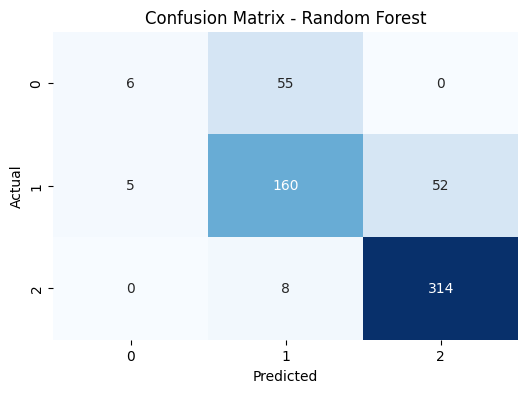


Training classifier KNN:
GaussianNB()

Accuracy: 80.00%
Precision: 70.70%
Recall: 60.36%
F1-Score: 60.22%

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.10      0.17        61
           1       0.72      0.74      0.73       217
           2       0.86      0.98      0.91       322

    accuracy                           0.80       600
   macro avg       0.71      0.60      0.60       600
weighted avg       0.78      0.80      0.77       600


Confusion Matrix:


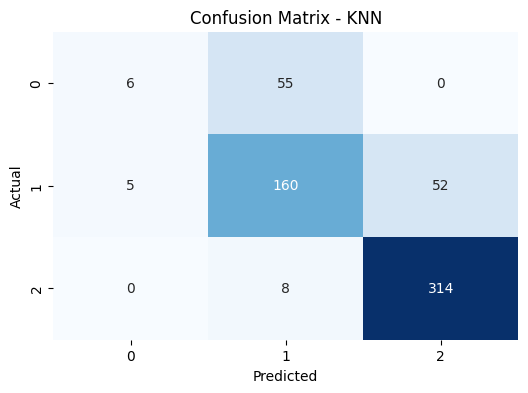


Training classifier Decision Tree:
GaussianNB()

Accuracy: 80.00%
Precision: 70.70%
Recall: 60.36%
F1-Score: 60.22%

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.10      0.17        61
           1       0.72      0.74      0.73       217
           2       0.86      0.98      0.91       322

    accuracy                           0.80       600
   macro avg       0.71      0.60      0.60       600
weighted avg       0.78      0.80      0.77       600


Confusion Matrix:


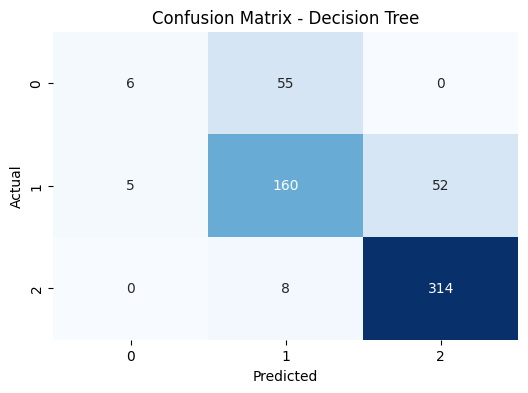


Training classifier SVM:
GaussianNB()

Accuracy: 80.00%
Precision: 70.70%
Recall: 60.36%
F1-Score: 60.22%

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.10      0.17        61
           1       0.72      0.74      0.73       217
           2       0.86      0.98      0.91       322

    accuracy                           0.80       600
   macro avg       0.71      0.60      0.60       600
weighted avg       0.78      0.80      0.77       600


Confusion Matrix:


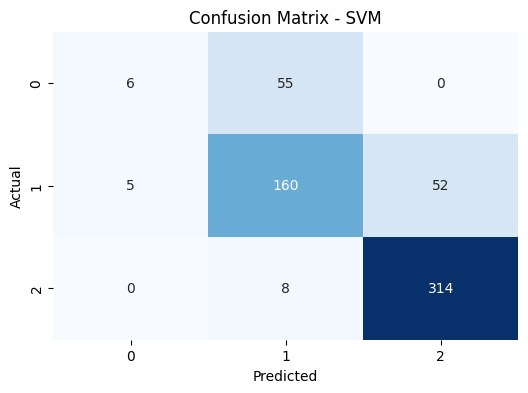


Training classifier Gaussian Naive Bayes:
GaussianNB()

Accuracy: 80.00%
Precision: 70.70%
Recall: 60.36%
F1-Score: 60.22%

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.10      0.17        61
           1       0.72      0.74      0.73       217
           2       0.86      0.98      0.91       322

    accuracy                           0.80       600
   macro avg       0.71      0.60      0.60       600
weighted avg       0.78      0.80      0.77       600


Confusion Matrix:


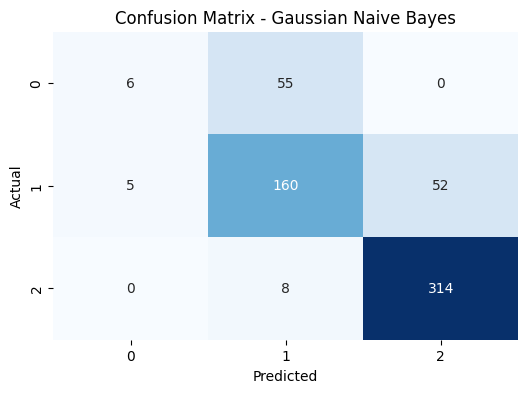

In [ ]:
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
)
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert X_test_scaled to a DataFrame to retain feature names
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Function to evaluate and display results for each model
def evaluate_model_detailed(model_name, model):
    print(f"\nTraining classifier {model_name}:")
    print(model)

    # Predict on test set
    if model_name in ["Logistic Regression", "KNN", "SVM"]:
        y_pred = model.predict(X_test_scaled_df)
        y_prob = (
            model.predict_proba(X_test_scaled_df)[:, 1]
            if len(set(y_test)) == 2
            else None
        )
    else:
        y_pred = model.predict(X_test_scaled_df)
        y_prob = (
            model.predict_proba(X_test_scaled_df)[:, 1]
            if len(set(y_test)) == 2
            else None
        )

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average="macro")
    recall = recall_score(y_test, y_pred, average="macro")
    f1 = f1_score(y_test, y_pred, average="macro")
    cm = confusion_matrix(y_test, y_pred)

    print(f"\nAccuracy: {acc * 100:.2f}%")
    print(f"Precision: {precision * 100:.2f}%")
    print(f"Recall: {recall * 100:.2f}%")
    print(f"F1-Score: {f1 * 100:.2f}%")

    if len(set(y_test)) == 2 and y_prob is not None:
        auc = roc_auc_score(y_test, y_prob)
        print(f"ROC AUC: {auc * 100:.2f}%")

    # Print classification report
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    # Plot confusion matrix
    print("\nConfusion Matrix:")
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

# Evaluate and display results for each model one by one
for model_name, model in best_models.items():
    evaluate_model_detailed(model_name, model)
